In [408]:
import pandas as pd
import numpy as np
import datetime as dt
from pandas import datetime
from matplotlib import pyplot as plt
import os
import calendar
from sklearn.ensemble import BaggingRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process import kernels
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
import math
from sklearn.metrics import mean_squared_error
import seaborn as sns
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import xgboost
from xgboost.sklearn      import XGBRegressor
from sklearn.metrics import mean_absolute_error
plt.rcParams["figure.figsize"] = (25,10)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  after removing the cwd from sys.path.


In [2]:
def mda(actual: np.ndarray, predicted: np.ndarray):
    "Mean Directional Accuracy"
    return np.mean((np.sign(actual[1:] - actual[:-1]) == np.sign(predicted[1:] - predicted[:-1])))

In [3]:
energy = pd.read_csv('energy.csv')
np.where(pd.isna(energy['energy(kWh/hh)']))

(array([], dtype=int64),)

# Single household

In [4]:
alldata = pd.read_csv("hc_0.csv")
household = "MAC000246"

df = alldata[alldata["LCLid"] == household ]
df.reset_index(drop=True, inplace=True)
print(df.head())

   Unnamed: 0                         tstp      LCLid energy(kWh/hh)
0       24141  2011-12-03 09:00:00.0000000  MAC000246         0.149 
1       24142  2011-12-03 09:30:00.0000000  MAC000246         0.154 
2       24143  2011-12-03 10:00:00.0000000  MAC000246         0.768 
3       24144  2011-12-03 10:30:00.0000000  MAC000246         1.179 
4       24145  2011-12-03 11:00:00.0000000  MAC000246         0.588 


In [5]:
df['tstp'] = df['tstp'].astype('datetime64[s]')

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [6]:
df.loc[:,'datetime'] = pd.to_datetime(df.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
df.loc[:,'date'] = df.loc[:,'tstp'].dt.date
df.loc[:,'month'] = df.loc[:,'datetime'].dt.month
df.loc[:,'day_of_month'] = df.loc[:,'datetime'].dt.day
df.loc[:,'time'] = df.loc[:,'datetime'].dt.time
df.loc[:,'weekday'] = df.loc[:,'datetime'].dt.weekday

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [7]:
del df['Unnamed: 0']
df

,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday
0,2011-12-03 09:00:00,MAC000246,0.149,2011-12-03 09:00:00,2011-12-03,12,3,09:00:00,5
1,2011-12-03 09:30:00,MAC000246,0.154,2011-12-03 09:30:00,2011-12-03,12,3,09:30:00,5
2,2011-12-03 10:00:00,MAC000246,0.768,2011-12-03 10:00:00,2011-12-03,12,3,10:00:00,5
3,2011-12-03 10:30:00,MAC000246,1.179,2011-12-03 10:30:00,2011-12-03,12,3,10:30:00,5
4,2011-12-03 11:00:00,MAC000246,0.588,2011-12-03 11:00:00,2011-12-03,12,3,11:00:00,5
...,...,...,...,...,...,...,...,...,...
39240,2014-02-27 22:00:00,MAC000246,2.4360001,2014-02-27 22:00:00,2014-02-27,2,27,22:00:00,3
39241,2014-02-27 22:30:00,MAC000246,1.12,2014-02-27 22:30:00,2014-02-27,2,27,22:30:00,3
39242,2014-02-27 23:00:00,MAC000246,0.701,2014-02-27 23:00:00,2014-02-27,2,27,23:00:00,3
39243,2014-02-27 23:30:00,MAC000246,0.223,2014-02-27 23:30:00,2014-02-27,2,27,23:30:00,3


In [8]:
energy.count()

Unnamed: 0        3961205
tstp              3961205
LCLid             3961205
energy(kWh/hh)    3961205
dtype: int64

In [9]:


print('Earliest date:', df.date.min())
print('Latest date:', df.date.max())



Earliest date: 2011-12-03
Latest date: 2014-02-28


In [10]:
df = df[df["energy(kWh/hh)"] != "Null"]
df.loc[:,"energy"] = df["energy(kWh/hh)"].astype("float64")

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [238]:
monday_df = df.loc[df['weekday'] == 0]

In [244]:
monday_df


,index,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,energy
0,78,2011-12-05 00:00:00,MAC000246,0.471,2011-12-05 00:00:00,2011-12-05,12,5,00:00:00,0,1.405
1,79,2011-12-05 00:30:00,MAC000246,0.934,2011-12-05 00:30:00,2011-12-05,12,5,00:30:00,0,0.934
2,80,2011-12-05 01:00:00,MAC000246,0.326,2011-12-05 01:00:00,2011-12-05,12,5,01:00:00,0,0.469
3,81,2011-12-05 01:30:00,MAC000246,0.143,2011-12-05 01:30:00,2011-12-05,12,5,01:30:00,0,0.143
4,82,2011-12-05 02:00:00,MAC000246,0.13,2011-12-05 02:00:00,2011-12-05,12,5,02:00:00,0,0.239
...,...,...,...,...,...,...,...,...,...,...,...
5610,39095,2014-02-24 21:30:00,MAC000246,1.202,2014-02-24 21:30:00,2014-02-24,2,24,21:30:00,0,2.565
5611,39096,2014-02-24 22:00:00,MAC000246,1.363,2014-02-24 22:00:00,2014-02-24,2,24,22:00:00,0,1.363
5612,39097,2014-02-24 22:30:00,MAC000246,0.942,2014-02-24 22:30:00,2014-02-24,2,24,22:30:00,0,1.240
5613,39098,2014-02-24 23:00:00,MAC000246,0.298,2014-02-24 23:00:00,2014-02-24,2,24,23:00:00,0,0.298


In [240]:
monday_df.reset_index(inplace = True)

In [241]:
monday_df['energy']

0       0.471
1       0.934
2       0.326
3       0.143
4       0.130
        ...  
5610    1.202
5611    1.363
5612    0.942
5613    0.298
5614    1.041
Name: energy, Length: 5615, dtype: float64

In [242]:
monday_df['energy'][i::2]

5614    1.041
Name: energy, dtype: float64

In [243]:
for i in range(len(monday_df)-1):
    if i % 2 == 0:
        monday_df['energy'][i] = monday_df['energy'][i+1] + monday_df['energy'][i]

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [245]:
# FOR LATER USE
tuesday_df = df.loc[df['weekday'] == 1]
tuesday_df.loc[:,'time'] = tuesday_df.loc[:,'datetime'].dt.time
tuesday_df.loc[:,'hour'] = tuesday_df.loc[:,'datetime'].dt.hour
tuesday_df.loc[:,'minute'] = tuesday_df.loc[:,'datetime'].dt.minute
wednesday_df = df.loc[df['weekday'] == 2]
thursday_df = df.loc[df['weekday'] == 3]
friday_df = df.loc[df['weekday'] == 4]
saturday_df = df.loc[df['weekday'] == 5]
sunday_df = df.loc[df['weekday'] == 6]

C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
C:\anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


In [246]:
tuesday_df.reset_index(inplace = True)
wednesday_df.reset_index(inplace = True)
for i in range(len(tuesday_df)-1):
    if i % 2 == 0:
        tuesday_df['energy'][i] = tuesday_df['energy'][i+1] + tuesday_df['energy'][i]
for i in range(len(wednesday_df)-1):
    if i % 2 == 0:
        wednesday_df['energy'][i] = wednesday_df['energy'][i+1] + wednesday_df['energy'][i]        

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


# Weather info

In [247]:
weather = pd.read_csv('weather_hourly_darksky.csv')
weather.head(4)

,visibility,windBearing,temperature,time,dewPoint,pressure,apparentTemperature,windSpeed,precipType,icon,humidity,summary
0,5.97,104,10.24,2011-11-11 00:00:00,8.86,1016.76,10.24,2.77,rain,partly-cloudy-night,0.91,Partly Cloudy
1,4.88,99,9.76,2011-11-11 01:00:00,8.83,1016.63,8.24,2.95,rain,partly-cloudy-night,0.94,Partly Cloudy
2,3.70,98,9.46,2011-11-11 02:00:00,8.79,1016.36,7.76,3.17,rain,partly-cloudy-night,0.96,Partly Cloudy
3,3.12,99,9.23,2011-11-11 03:00:00,8.63,1016.28,7.44,3.25,rain,fog,0.96,Foggy


In [248]:
weather.describe()

,visibility,windBearing,temperature,dewPoint,pressure,apparentTemperature,windSpeed,humidity
count,21165.000000,21165.000000,21165.000000,21165.000000,21152.000000,21165.000000,21165.000000,21165.000000
mean,11.166485,195.685897,10.471486,6.530501,1014.125153,9.230338,3.905215,0.781829
std,3.099337,90.629453,5.781904,5.041965,11.388337,6.940919,2.026854,0.140369
min,0.180000,0.000000,-5.640000,-9.980000,975.740000,-8.880000,0.040000,0.230000
25%,10.120000,121.000000,6.470000,2.820000,1007.430000,3.900000,2.420000,0.700000
50%,12.260000,217.000000,9.930000,6.570000,1014.780000,9.360000,3.680000,0.810000
75%,13.080000,256.000000,14.310000,10.330000,1022.050000,14.320000,5.070000,0.890000
max,16.090000,359.000000,32.400000,19.880000,1043.320000,32.420000,14.800000,1.000000


In [249]:
pd.to_datetime(weather['time'])
weather = weather[['temperature', 'windBearing', 'dewPoint', 'windSpeed',
       'pressure', 'visibility', 'humidity', 'apparentTemperature','time']]
weather.rename(columns = {'time':'tstp'}, inplace = True)
weather = weather.dropna()

In [250]:
pd.to_datetime(weather['tstp'])
weather['tstp'] = weather['tstp'].astype('datetime64[s]')

In [251]:
weather.loc[:,'datetime'] = pd.to_datetime(weather.loc[:,'tstp'], '%Y-%m-%d %H:%M:%S')
weather.loc[:,'date'] = weather.loc[:,'tstp'].dt.date
weather.loc[:,'time'] = weather.loc[:,'datetime'].dt.time
weather.loc[:,'hour'] = weather.loc[:,'datetime'].dt.hour
weather.loc[:,'minute'] = weather.loc[:,'datetime'].dt.minute
weather.sort_values(by = ['date','time'])
del weather['date']
del weather['time']
del weather['datetime']

# Merge with single household data

In [252]:
weather_energy = wednesday_df.merge(weather,on='tstp')
weather_energy

,index,tstp,LCLid,energy(kWh/hh),datetime,date,month,day_of_month,time,weekday,...,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity,apparentTemperature,hour,minute
0,174,2011-12-07 00:00:00,MAC000246,0.735,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,...,6.63,236,4.53,5.49,1005.27,14.13,0.86,3.17,0,0
1,176,2011-12-07 01:00:00,MAC000246,0.41,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,...,7.67,236,5.41,5.84,1004.20,13.49,0.86,4.33,1,0
2,178,2011-12-07 02:00:00,MAC000246,0.432,2011-12-07 02:00:00,2011-12-07,12,7,02:00:00,2,...,7.76,239,5.46,6.53,1003.06,13.50,0.85,4.21,2,0
3,180,2011-12-07 03:00:00,MAC000246,0.077,2011-12-07 03:00:00,2011-12-07,12,7,03:00:00,2,...,8.26,244,5.88,7.16,1002.31,13.16,0.85,4.66,3,0
4,182,2011-12-07 04:00:00,MAC000246,0.05,2011-12-07 04:00:00,2011-12-07,12,7,04:00:00,2,...,8.61,250,5.71,7.06,1001.93,13.05,0.82,5.14,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,39186,2014-02-26 19:00:00,MAC000246,0.157,2014-02-26 19:00:00,2014-02-26,2,26,19:00:00,2,...,7.73,215,2.23,3.85,1016.35,16.09,0.68,5.29,19,0
2804,39188,2014-02-26 20:00:00,MAC000246,0.174,2014-02-26 20:00:00,2014-02-26,2,26,20:00:00,2,...,7.06,206,2.38,3.49,1016.24,16.09,0.72,4.67,20,0
2805,39190,2014-02-26 21:00:00,MAC000246,0.45,2014-02-26 21:00:00,2014-02-26,2,26,21:00:00,2,...,6.58,206,2.75,3.97,1016.02,15.84,0.77,3.82,21,0
2806,39192,2014-02-26 22:00:00,MAC000246,1.158,2014-02-26 22:00:00,2014-02-26,2,26,22:00:00,2,...,6.24,207,3.11,3.74,1015.85,12.96,0.80,3.53,22,0


In [253]:
weather_energy.rename(columns = {'energy(kWh/hh)':'en_consum'}, inplace = True)

In [254]:
del weather_energy['en_consum']

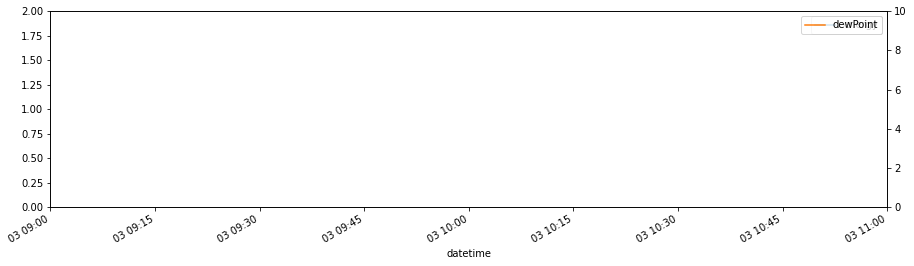

In [255]:
#FOR LATER USE!
fig, axes = plt.subplots(nrows=1, ncols=1)
weather_energy.plot(x = "datetime",y="energy", figsize=(15, 4),ylim = (0,2), xlim=('2011-12-03 09:00:00', '2011-12-03 11:00:00'), ax = axes)
axes = axes.twinx()
weather_energy.plot(x = "datetime",y=["dewPoint"], figsize=(15, 4),ylim = (0,10), xlim=('2011-12-03 09:00:00', '2011-12-03 11:00:00'), color = 'tab:orange', ax = axes)
plt.show()

In [256]:
cor_matrix = weather_energy[['energy','temperature', 'windBearing', 'dewPoint', 'windSpeed',
       'pressure', 'visibility', 'humidity']].corr()
cor_matrix

,energy,temperature,windBearing,dewPoint,windSpeed,pressure,visibility,humidity
energy,1.000000,-0.160590,-0.016094,-0.118342,-0.034840,-0.033505,0.004647,0.097064
temperature,-0.160590,1.000000,0.061423,0.858416,-0.055175,0.043564,0.247949,-0.419931
windBearing,-0.016094,0.061423,1.000000,0.106085,0.124274,-0.063019,0.224002,0.046195
dewPoint,-0.118342,0.858416,0.106085,1.000000,-0.099860,-0.061065,0.004437,0.097696
windSpeed,-0.034840,-0.055175,0.124274,-0.099860,1.000000,-0.367538,0.235944,-0.112388
pressure,-0.033505,0.043564,-0.063019,-0.061065,-0.367538,1.000000,-0.015248,-0.181785
visibility,0.004647,0.247949,0.224002,0.004437,0.235944,-0.015248,1.000000,-0.519417
humidity,0.097064,-0.419931,0.046195,0.097696,-0.112388,-0.181785,-0.519417,1.000000


# Bank holidays

In [257]:
holiday = pd.read_csv('uk_bank_holidays.csv')
holiday['Bank holidays'] = pd.to_datetime(holiday['Bank holidays']).dt.date
holiday.head(4)

,Bank holidays,Type
0,2012-12-26,Boxing Day
1,2012-12-25,Christmas Day
2,2012-08-27,Summer bank holiday
3,2012-05-06,Queen?s Diamond Jubilee (extra bank holiday)


In [258]:
weather_energy = weather_energy.merge(holiday, left_on = 'date',right_on = 'Bank holidays', how = 'left')
weather_energy['holiday_ind'] = np.where(weather_energy['Bank holidays'].isna(),0,1)

# ACORN data

In [259]:
house_info = pd.read_csv('informations_households.csv')

In [260]:
house_info

,LCLid,stdorToU,Acorn,Acorn_grouped,file
0,MAC005492,ToU,ACORN-,ACORN-,block_0
1,MAC001074,ToU,ACORN-,ACORN-,block_0
2,MAC000002,Std,ACORN-A,Affluent,block_0
3,MAC003613,Std,ACORN-A,Affluent,block_0
4,MAC003597,Std,ACORN-A,Affluent,block_0
...,...,...,...,...,...
5561,MAC002056,Std,ACORN-U,ACORN-U,block_111
5562,MAC004587,Std,ACORN-U,ACORN-U,block_111
5563,MAC004828,Std,ACORN-U,ACORN-U,block_111
5564,MAC001704,ToU,ACORN-U,ACORN-U,block_111


In [261]:
LCLids_del = house_info.loc[house_info.Acorn == 'ACORN-'].LCLid.values
LCLids_del

array(['MAC005492', 'MAC001074'], dtype=object)

In [262]:
#Delete these houses from the current block being analysed
for i in range (0,len(LCLids_del)): 
    if any(weather_energy.LCLid == LCLids_del[i]):
        weather_energy = weather_energy.loc [weather_energy.LCLid != LCLids_del[i]]
        print(i)

In [263]:
weather_energy_info = weather_energy.merge(house_info, on = 'LCLid')

In [264]:
del weather_energy_info['file']

# Adding Lags

In [265]:
tuesday_df['time'] = tuesday_df['hour'] + tuesday_df['minute']/60
tuesday_df = tuesday_df[::2]

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [266]:
weather_energy_info['lag1'] = weather_energy_info['energy'].shift(periods = 1, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag2'] = weather_energy_info['energy'].shift(periods = 2, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag3'] = weather_energy_info['energy'].shift(periods = 3, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag4'] = weather_energy_info['energy'].shift(periods = 4, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag5'] = weather_energy_info['energy'].shift(periods = 5, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag24'] = weather_energy_info['energy'].shift(periods = 24, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag25'] = weather_energy_info['energy'].shift(periods = 25, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['lag26'] = weather_energy_info['energy'].shift(periods = 26, fill_value=weather_energy_info['energy'].mean())
weather_energy_info['ld0'] = tuesday_df['energy'].values
weather_energy_info['ld1'] = weather_energy_info['ld0'].shift(periods = 1, fill_value=weather_energy_info['ld0'].mean())
weather_energy_info['ld2'] = weather_energy_info['ld0'].shift(periods = 2, fill_value=weather_energy_info['ld0'].mean())
weather_energy_info['ld3'] = weather_energy_info['ld0'].shift(periods = 3, fill_value=weather_energy_info['ld0'].mean())

In [267]:
weather_energy_info

,index,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,...,lag3,lag4,lag5,lag24,lag25,lag26,ld0,ld1,ld2,ld3
0,174,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,00:00:00,2,0.924,...,0.627246,0.627246,0.627246,0.627246,0.627246,0.627246,1.519,0.78184,0.78184,0.78184
1,176,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,01:00:00,2,1.272,...,0.627246,0.627246,0.627246,0.627246,0.627246,0.627246,1.381,1.51900,0.78184,0.78184
2,178,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,02:00:00,2,0.488,...,0.627246,0.627246,0.627246,0.627246,0.627246,0.627246,1.365,1.38100,1.51900,0.78184
3,180,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,03:00:00,2,0.107,...,0.924000,0.627246,0.627246,0.627246,0.627246,0.627246,0.262,1.36500,1.38100,1.51900
4,182,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,04:00:00,2,0.076,...,1.272000,0.924000,0.627246,0.627246,0.627246,0.627246,0.211,0.26200,1.36500,1.38100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,39186,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19:00:00,2,0.286,...,0.523000,0.536000,0.561000,1.022000,0.241000,0.155000,0.509,0.37700,0.36500,0.35600
2804,39188,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20:00:00,2,0.511,...,0.703000,0.523000,0.536000,1.494000,1.022000,0.241000,1.964,0.50900,0.37700,0.36500
2805,39190,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21:00:00,2,1.391,...,0.386000,0.703000,0.523000,1.870000,1.494000,1.022000,3.508,1.96400,0.50900,0.37700
2806,39192,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22:00:00,2,2.161,...,0.286000,0.386000,0.703000,0.905000,1.870000,1.494000,2.661,3.50800,1.96400,0.50900


# Visualization

In [268]:
def get_season(date):
    Y = date.year 
    seasons = [('winter', (dt.date(Y,  1,  1),  dt.date(Y,  3, 20))),
               ('spring', (dt.date(Y,  3, 21),  dt.date(Y,  6, 20))),
               ('summer', (dt.date(Y,  6, 21),  dt.date(Y,  9, 22))),
               ('autumn', (dt.date(Y,  9, 23),  dt.date(Y, 12, 20))),
               ('winter', (dt.date(Y, 12, 21),  dt.date(Y, 12, 31)))]
    return next(season for season, (start, end) in seasons
                if start <= date <= end)


def get_day_part(hourofd):
    day_times = [('night',(0,6)), ('morning', (6,10)), ('noon', (10,14)), 
                 ('afternoon',(14,18)), ('evening', (18,22)), ('night',(22,24))]
    return next(day_time for day_time, (start, end) in day_times
                if start <= hourofd < end)
def calculate_dayofy(datetimes):
    days = datetimes.day.values 
    months = datetimes.month.values 
    years = datetimes.year.values
    dayofy = np.zeros(days.shape)
    for i in range(len(days)):
        diff = dt.date(years[i], months[i], days[i]) - dt.date(years[i], 1, 1)
        dayofy[i] = diff.days
    return dayofy

In [269]:
weather_energy_info['weekday'] = weather_energy_info.loc[:,'tstp'].dt.day_name()
weather_energy_info['flag_weekend'] = weather_energy_info.loc[:,'weekday'].replace(['Saturday', 'Sunday'], True).replace(['Monday','Tuesday','Wednesday','Thursday','Friday'],False)
weather_energy_info['dayofy'] = calculate_dayofy(weather_energy_info.loc[:,'tstp'].dt)
weather_energy_info['dayofy_x'] = np.sin(weather_energy_info['dayofy']/365*2*math.pi)
weather_energy_info['dayofy_y'] = np.cos(weather_energy_info['dayofy']/365*2*math.pi)
weather_energy['dayofy'] = calculate_dayofy(weather_energy.loc[:,'tstp'].dt)
weather_energy['dayofy_x'] = np.sin(weather_energy['dayofy']/365*2*math.pi)
weather_energy['dayofy_y'] = np.cos(weather_energy['dayofy']/365*2*math.pi)
weather_energy_info['time'] = weather_energy_info['hour'] + weather_energy_info['minute']/60
# time of day
weather_energy_info['daypart'] = [get_day_part(h) for h in weather_energy_info.time] 
# month
weather_energy_info['month'] = weather_energy_info.loc[:,'tstp'].dt.month
# season
weather_energy_info['season'] = [get_season(date) for date in weather_energy_info.date]

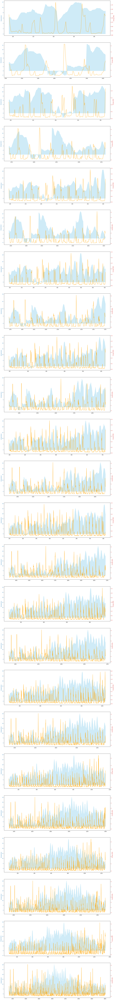

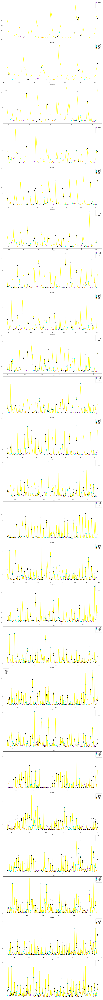

In [270]:
# plot consumption over different months
ind1 = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2012), side='left')
ind2 = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2013), side='left')
# colors
color_dict = {
  "weekday": "blue",
  "weekend": "red",
  "holiday": "green"
}
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
fig, axs = plt.subplots(24, 1, figsize=(20,24*8))
fff, xxx = plt.subplots(24, 1, figsize=(20,24*8))

for i in np.arange(1,13):
    if not i==12:
        ind1_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=i+1,year=2012), side='left')
    else:
        ind1_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=1,year=2013), side='left')
    df_temp = weather_energy_info.iloc[np.arange(ind1,ind1_next),:]
    # temperature
    ax1 = axs[2*(i-1)]
    color = 'tab:blue'
    ax1.set_ylabel('temperature', color=color) 
    ax1.fill_between(df_temp.index, np.array(df_temp.temperature.values, dtype=float),
                 color="skyblue", alpha=0.4)
    ax1.tick_params(axis='y', labelcolor=color)
    # energy
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_xlabel('Sample Number')
    ax2.set_ylabel('Energy [KW]', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='orange')
    # energy color by time
    xxx[2*(i-1)].plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='yellow')
    groups = df_temp.groupby('daypart')
    for name, group in groups:
        xxx[2*(i-1)].plot(group.index, group.energy, marker='o', linestyle='', ms=4, label=name, c=color_dict_dp[name])
    xxx[2*(i-1)].legend()
    xxx[2*(i-1)].set_title(weather_energy_info.date.iloc[ind1].strftime("%B") + '2012')
    
    
    
    # 2013
    if not i==12:
        ind2_next = weather_energy_info.date.searchsorted(dt.date(day=1,month=i+1,year=2013), side='left')
        df_temp = weather_energy_info.iloc[ind2:ind2_next,:]
    else:   
        df_temp = weather_energy_info.iloc[ind2:,:]
    # temperature
    ax1 = axs[2*i-1]
    color = 'tab:blue'
    ax1.set_ylabel('temperature', color=color)  
    ax1.fill_between(df_temp.index, np.array(df_temp.temperature.values, dtype=float),
                 color="skyblue", alpha=0.4)
    ax1.tick_params(axis='y', labelcolor=color)
    # energy
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_xlabel('Sample Number')
    ax2.set_ylabel('Energy [KW]', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    # connect all with narrow line
    ax2.plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='orange')
    # energy color by time
    xxx[2*i-1].plot(df_temp.index, df_temp.energy, marker='', linestyle='-', ms=1, c='yellow')
    groups = df_temp.groupby('daypart')
    for name, group in groups:
        xxx[2*i-1].plot(group.index, group.energy, marker='o', linestyle='', ms=4, label=name, c=color_dict_dp[name])
    xxx[2*i-1].legend()
    xxx[2*i-1].set_title(weather_energy_info.date.iloc[ind1].strftime("%B") + '2013')
    
plt.tight_layout()
plt.show()

## Box plots

In [271]:
weather_energy_info

,index,tstp,LCLid,datetime,date,month,day_of_month,time,weekday,energy,...,ld0,ld1,ld2,ld3,flag_weekend,dayofy,dayofy_x,dayofy_y,daypart,season
0,174,2011-12-07 00:00:00,MAC000246,2011-12-07 00:00:00,2011-12-07,12,7,0.0,Wednesday,0.924,...,1.519,0.78184,0.78184,0.78184,False,340.0,-0.417194,0.908818,night,autumn
1,176,2011-12-07 01:00:00,MAC000246,2011-12-07 01:00:00,2011-12-07,12,7,1.0,Wednesday,1.272,...,1.381,1.51900,0.78184,0.78184,False,340.0,-0.417194,0.908818,night,autumn
2,178,2011-12-07 02:00:00,MAC000246,2011-12-07 02:00:00,2011-12-07,12,7,2.0,Wednesday,0.488,...,1.365,1.38100,1.51900,0.78184,False,340.0,-0.417194,0.908818,night,autumn
3,180,2011-12-07 03:00:00,MAC000246,2011-12-07 03:00:00,2011-12-07,12,7,3.0,Wednesday,0.107,...,0.262,1.36500,1.38100,1.51900,False,340.0,-0.417194,0.908818,night,autumn
4,182,2011-12-07 04:00:00,MAC000246,2011-12-07 04:00:00,2011-12-07,12,7,4.0,Wednesday,0.076,...,0.211,0.26200,1.36500,1.38100,False,340.0,-0.417194,0.908818,night,autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,39186,2014-02-26 19:00:00,MAC000246,2014-02-26 19:00:00,2014-02-26,2,26,19.0,Wednesday,0.286,...,0.509,0.37700,0.36500,0.35600,False,56.0,0.821477,0.570242,evening,winter
2804,39188,2014-02-26 20:00:00,MAC000246,2014-02-26 20:00:00,2014-02-26,2,26,20.0,Wednesday,0.511,...,1.964,0.50900,0.37700,0.36500,False,56.0,0.821477,0.570242,evening,winter
2805,39190,2014-02-26 21:00:00,MAC000246,2014-02-26 21:00:00,2014-02-26,2,26,21.0,Wednesday,1.391,...,3.508,1.96400,0.50900,0.37700,False,56.0,0.821477,0.570242,evening,winter
2806,39192,2014-02-26 22:00:00,MAC000246,2014-02-26 22:00:00,2014-02-26,2,26,22.0,Wednesday,2.161,...,2.661,3.50800,1.96400,0.50900,False,56.0,0.821477,0.570242,night,winter


Text(0.5, 1.0, 'Day Parts Box Plot')

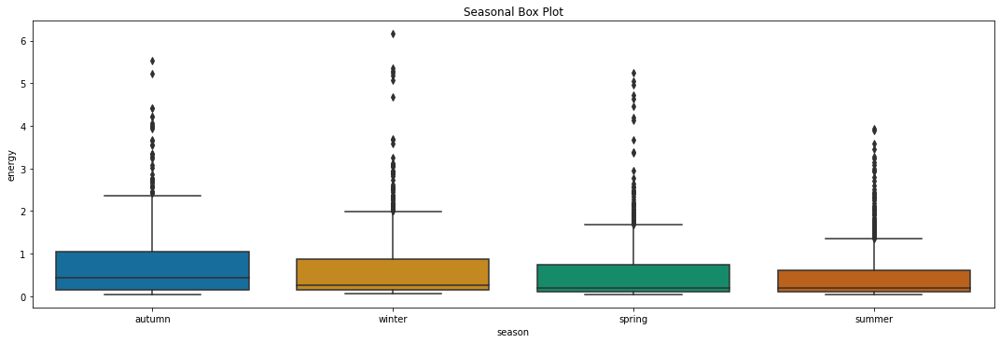

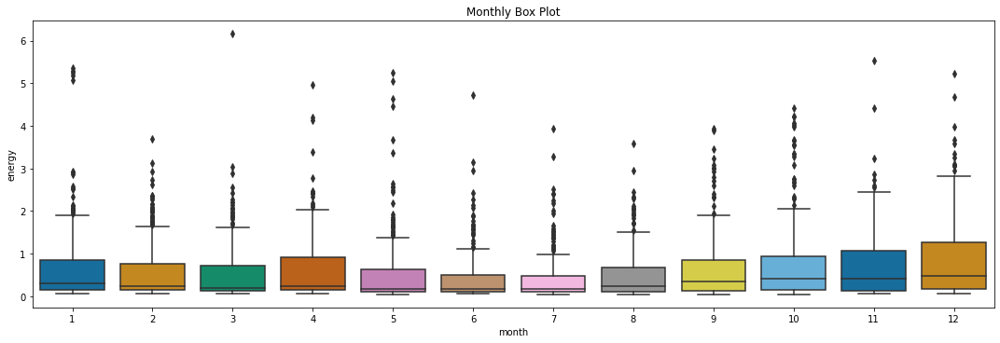

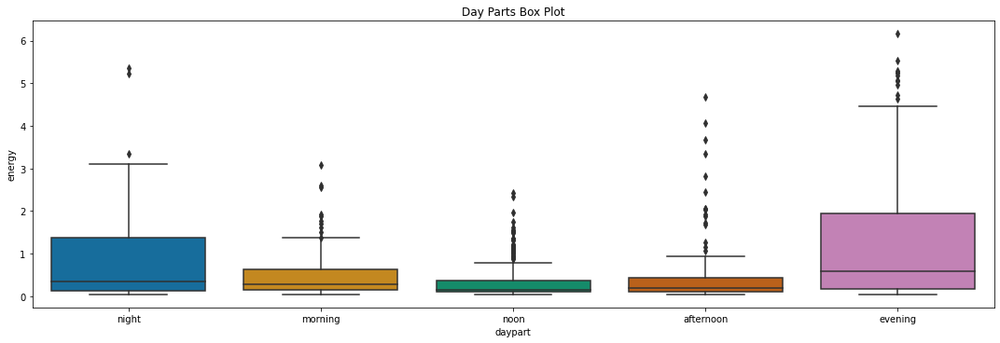

In [272]:
######


fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='season', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Seasonal Box Plot')

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='month', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Monthly Box Plot')

fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y='energy', x='daypart', data=weather_energy_info, 
            palette="colorblind", 
            ax=ax)
plt.tight_layout()
ax.set_title('Day Parts Box Plot')



<AxesSubplot:xlabel='hour', ylabel='energy'>

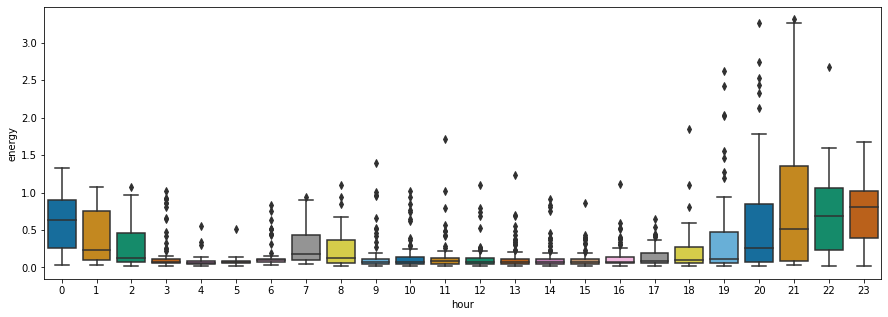

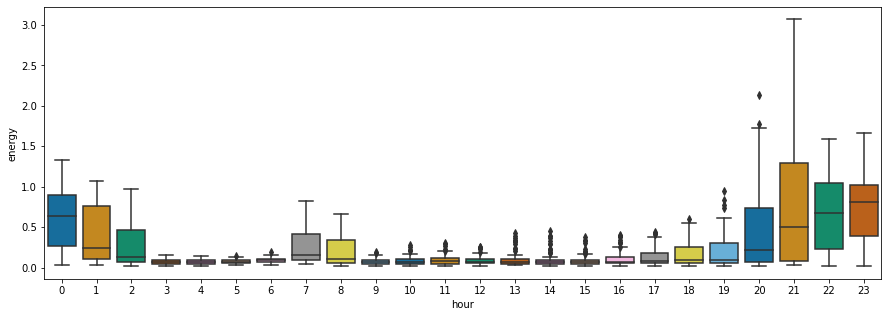

In [273]:
fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y=y_train['energy'], x='hour', data=X_train, 
            palette="colorblind", 
            ax=ax)
fig, ax = plt.subplots(figsize=(15,5))
sns.boxplot(y=y_train_filt, x='hour', data=X_train_filt, 
            palette="colorblind", 
            ax=ax)

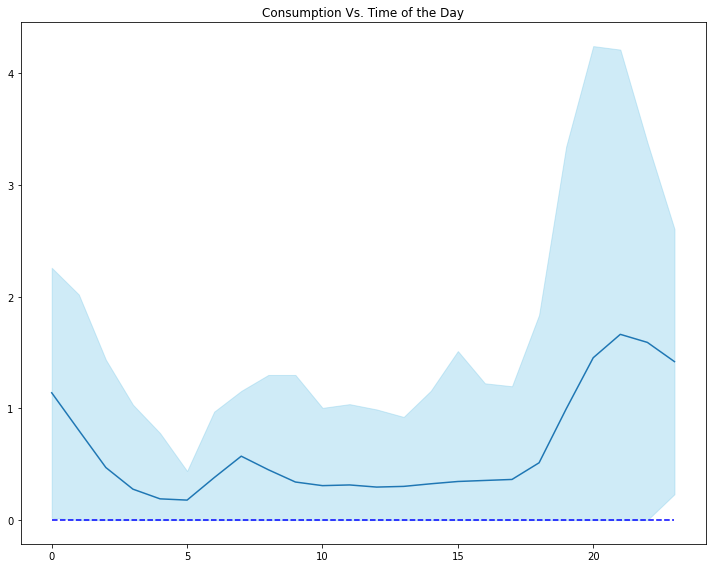

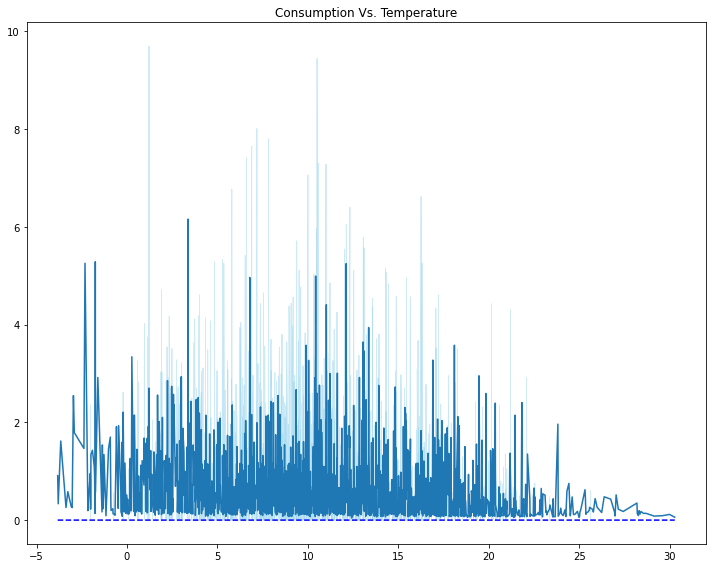

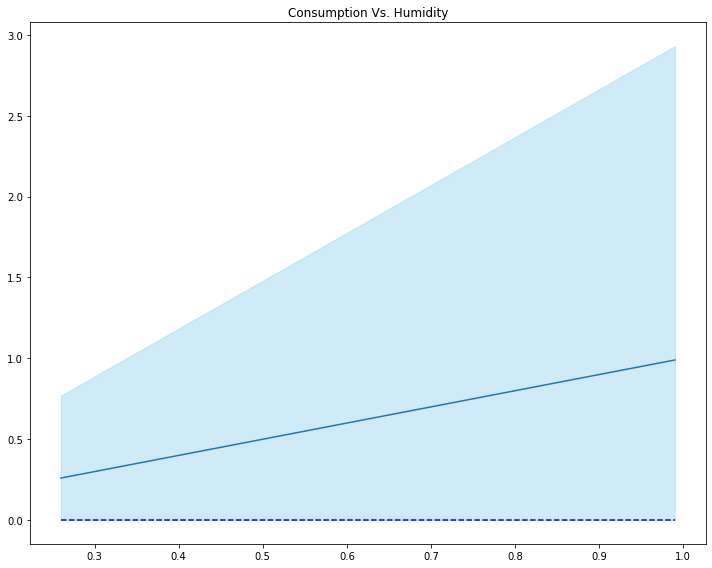

In [274]:
fig, ax = plt.subplots(1,1,figsize=(10,8))
hours = np.arange(0,24,1)
horiz_line_data = np.zeros(24)

de_temp = weather_energy_info.copy()
means = de_temp.groupby('hour', as_index=False)['energy'].mean()
means = np.array(means.energy.values, dtype=float)
stds = de_temp.groupby('hour', as_index=False)['energy'].std()
stds = np.array(stds.energy.values, dtype=float)
# plot mean
ax.plot(hours, means)
# cnof bound
ax.fill_between(hours, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(hours, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Time of the Day')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()

# temperature
fig, ax = plt.subplots(1,1,figsize=(10,8))
de_temp = weather_energy_info.copy()
means = de_temp.groupby('temperature', as_index=False)['energy'].mean()
temps = means.temperature.unique()
temps.sort()
horiz_line_data = np.zeros(len(temps))
means = np.array(means.energy.values, dtype=float)
stds = de_temp.groupby('temperature', as_index=False)['energy'].std()
stds = np.array(stds.energy.values, dtype=float)

# plot mean
ax.plot(temps, means)
# cnof bound
ax.fill_between(temps, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(temps, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Temperature')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()

# humidity
fig, ax = plt.subplots(1,1,figsize=(10,8))
de_temp = weather_energy_info.copy()
means = de_temp.groupby('humidity', as_index=False)['energy'].mean()
temps = means.humidity.unique()
temps.sort()
horiz_line_data = np.zeros(len(temps))
means = np.array(means.humidity.values, dtype=float)
stds = de_temp.groupby('humidity', as_index=False)['energy'].std()
stds = np.array(stds.humidity.values, dtype=float)

# plot mean
ax.plot(temps, means)
# cnof bound
ax.fill_between(temps, means+1.96*stds, np.maximum(0,means-1.96*stds),
                 color="skyblue", alpha=0.4)
ax.plot(temps, horiz_line_data, 'b--') 
ax.set_title('Consumption Vs. Humidity')
ax1.set_ylabel('Energy [KW]')  
plt.tight_layout()


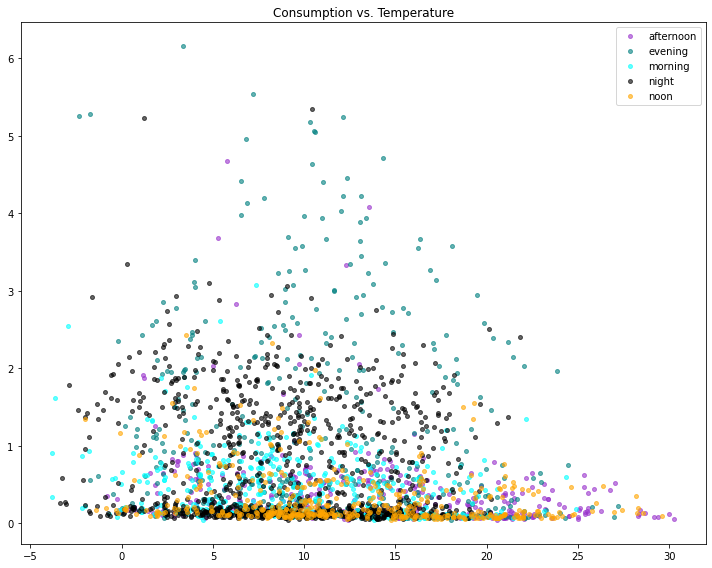

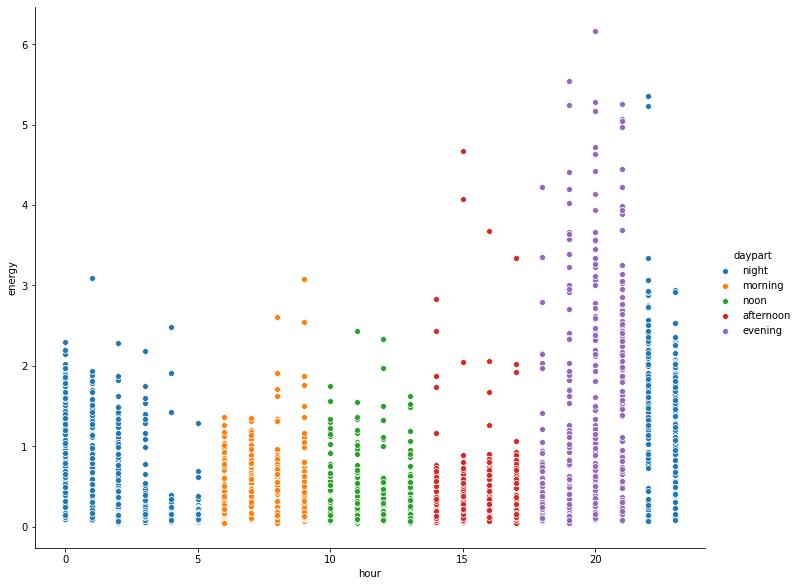

In [275]:
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
groups = weather_energy_info.groupby('daypart')
fig, ax = plt.subplots(figsize=(10,8))
for name, group in groups:
    ax.plot(group.temperature, group.energy, marker='o', 
            linestyle='', ms=4, label=name, c=color_dict_dp[name],alpha=0.6)
    ax.legend()
    ax.set_title('Consumption vs. Temperature')
               
plt.tight_layout()
plt.show()



pp = sns.pairplot(weather_energy_info[['energy', 'hour','daypart']],
                  x_vars=['hour'], y_vars=['energy'],
                  height=8, aspect=1.25, hue = "daypart")

#fig = pp.fig() 

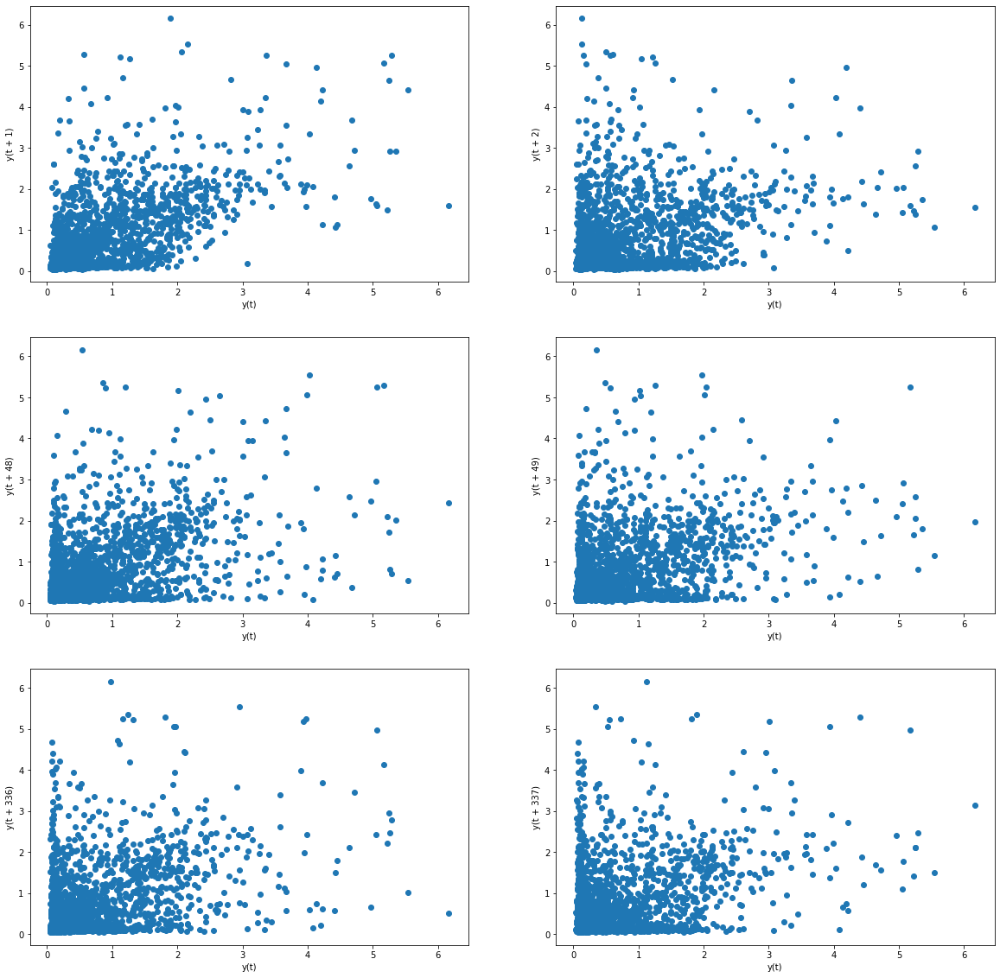

In [276]:
lags = [1, 2, 48, 49, 48*7, 48*7+1]
fig, axs = plt.subplots(math.ceil(len(lags)/2), 2, figsize=(20,20))
color_dict_dp = {
  "morning": "cyan",
  "noon": "orange",
  "afternoon":"darkorchid",
  "evening": "teal",
  "night":"black"
}
for i, lag in enumerate(lags):
    #colors = [color_dict_dp[j] for j in df_1p.daypart.iloc[0:35089-lag]]
    pd.plotting.lag_plot(weather_energy_info.energy, lag=lag, ax=axs[int(i/2), int(i%2)])
    


# Cutting Outliers

In [277]:
def cut_outlier(df, target):
    print(len(df))
    df_temp = df.copy()
    target_temp = target.copy()
    df_temp['energy'] = target_temp
    df_temp['datetimes'] = df.index
    filter = pd.Series([])
    for i in range(24):
        Q1 = df_temp[df_temp['hour'] == i]['energy'].quantile(0.25)
        Q3 = df_temp[df_temp['hour'] == i]['energy'].quantile(0.75)
        IQR = Q3 - Q1    #IQR is interquartile range. 

        filter = filter.append((df_temp[df_temp['hour'] == i]['energy'] >= Q1 - 1.5 * IQR) & (df_temp[df_temp['hour'] == i]['energy'] <= Q3 + 1.5 *IQR))
    filter.sort_index(ascending=True, inplace = True)
    print(filter)
    dummy = df_temp.copy()
    dummy1 = df_temp.copy()
    dummy2 = df_temp.copy()
    df_temp = df_temp.loc[filter]
    dummy1 = dummy2[dummy.index[-1]:]
    dummy.reset_index(inplace = True)
    frames = [dummy, dummy1]
    #df_temp = pd.concat(frames, ignore_index = True)
    df_temp.reset_index(inplace = True)
    df_temp.set_index(['datetimes'],inplace=True)
    target_temp = df_temp['energy']
    df_temp.drop(columns = 'energy', inplace = True)
    df_temp.drop(columns = ['datetime'], inplace = True)
    return df_temp, target_temp

In [388]:
Q1 = weather_energy['energy'].quantile(0.25)
Q3 = weather_energy['energy'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 

filter = (weather_energy['energy'] >= Q1 - 1.5 * IQR) & (weather_energy['energy'] <= Q3 + 1.5 *IQR)
print(filter)
deleted_feat = weather_energy.loc[~filter]
weather_energy = weather_energy.loc[filter]  


0        True
1        True
2        True
3        True
4        True
        ...  
2798     True
2799    False
2800    False
2801    False
2802     True
Name: energy, Length: 2803, dtype: bool


In [142]:
weather_energy.reset_index(inplace = True)

# Splitting data based on the daypart

In [278]:
night_df = weather_energy_info.loc[weather_energy_info['daypart'] == 'night']
evening_df = weather_energy_info.loc[weather_energy_info['daypart'] == 'evening']
afternoon = weather_energy_info.loc[weather_energy_info['daypart'] == 'afternoon']
morning = weather_energy_info.loc[weather_energy_info['daypart'] == 'morning']
noon = weather_energy_info.loc[weather_energy_info['daypart'] == 'noon']

In [279]:
morning_idx = morning.reset_index()
afternoon_idx = afternoon.reset_index()
evening_idx = evening_df.reset_index()
night_idx = night_df.reset_index()
noon_idx = noon.reset_index()

# Automated Feature selection

In [176]:
weather_energy_info['hourofd_x'] = np.sin(weather_energy_info['time']/24*2*math.pi)
weather_energy_info['hourofd_y'] = np.cos(weather_energy_info['time']/24*2*math.pi)

In [226]:
features = list(set(list(weather_energy_info.columns)) - set(['energy', 'daypart', 'season', 'weekday', 'stdorToU', 'tstp', 'Acorn','Acorn_grouped', 'datetime','date', 'Bank holidays', 'Type', 'LCLid', 'hour', 'apparentTemperature']))
X = weather_energy_info.loc[:, features]
Y = weather_energy_info['energy']
KBest = SelectKBest(score_func = mutual_info_regression, k = 10)
KBest = KBest.fit(X,Y)
df_scores = pd.DataFrame({'features': X.columns, 'Mutual_info': KBest.scores_, 'pValue': KBest.pvalues_ })
df_scores

,features,Mutual_info,pValue
0,windSpeed,0.019838,None
1,temperature,0.040802,None
2,flag_weekend,0.008688,None
3,holiday_ind,0.004540,None
4,visibility,0.027276,None
5,minute,0.001992,None
6,lag1,0.120617,None
7,lag2,0.009270,None
8,dewPoint,0.024732,None
9,lag4,0.000000,None


In [287]:
features = list(set(list(weather_energy_info.columns)) - set(['energy', 'daypart', 'season', 'weekday', 'stdorToU', 'tstp', 'Acorn','Acorn_grouped', 'datetime','date', 'Bank holidays', 'Type', 'LCLid', 'hour', 'apparentTemperature']))
X = weather_energy_info.loc[:, features]
Y = weather_energy_info['energy']
KBest = SelectKBest(score_func = f_regression, k = 12)
KBest = KBest.fit(X,Y)
df_scores = pd.DataFrame({'features': X.columns, 'F_score': KBest.scores_, 'pValue': KBest.pvalues_ })
df_scores

C:\anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:301: RuntimeWarning: invalid value encountered in true_divide
  corr /= X_norms


,features,F_score,pValue
0,windSpeed,6.550676,1.053651e-02
1,temperature,22.767291,1.922260e-06
2,flag_weekend,NaN,NaN
3,holiday_ind,3.358042,6.698364e-02
4,visibility,0.020013,8.875106e-01
5,minute,NaN,NaN
6,lag1,1399.731303,8.166906e-249
7,lag2,387.199609,7.611438e-81
8,dewPoint,2.658093,1.031366e-01
9,lag4,9.772407,1.789662e-03


In [288]:
cols = KBest.get_support(indices=True)
cols

array([ 1,  6,  7, 11, 12, 13, 14, 15, 16, 18, 19, 22], dtype=int64)

In [289]:
features = X.columns[cols]
features

Index(['temperature', 'lag1', 'lag2', 'dayofy_x', 'lag24', 'lag26', 'lag3',
       'humidity', 'time', 'month', 'lag25', 'dayofy_y'],
      dtype='object')

# Model construction

No handles with labels found to put in legend.
No handles with labels found to put in legend.


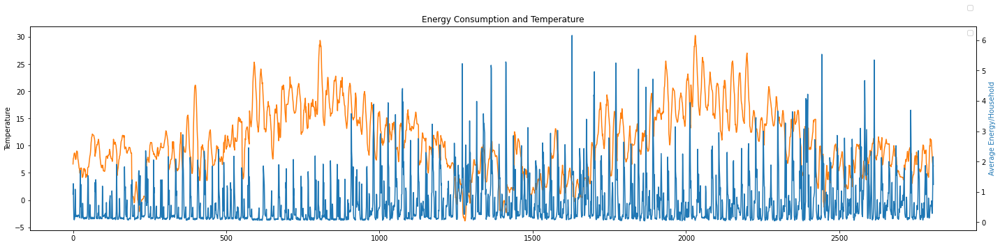

In [280]:
fig, ax1 = plt.subplots(figsize = (20,5))
ax1.plot(weather_energy.index, weather_energy.temperature, color = 'tab:orange')
ax1.set_ylabel('Temperature')
ax1.legend()
ax2 = ax1.twinx()
ax2.plot(weather_energy.index,weather_energy_info.energy,color = 'tab:blue')
ax2.set_ylabel('Average Energy/Household',color = 'tab:blue')
ax2.legend(bbox_to_anchor=(0.0, 1.02, 1.0, 0.102))
plt.title('Energy Consumption and Temperature')
fig.tight_layout()
plt.show()

In [281]:
weather_energy_info.set_index(['datetime'],inplace=True)

In [282]:
model_data_x = weather_energy_info[['hour','minute','temperature','humidity','holiday_ind', 'month', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26','ld0', 'ld1', 'ld2', 'ld3', 'dayofy_x', 'dayofy_y', 'daypart']]
model_data_y = weather_energy_info[['energy']]
X_train = model_data_x[:2000]
y_train = model_data_y[:2000]
X_test = model_data_x[2000:]
y_test = model_data_y[2000:]

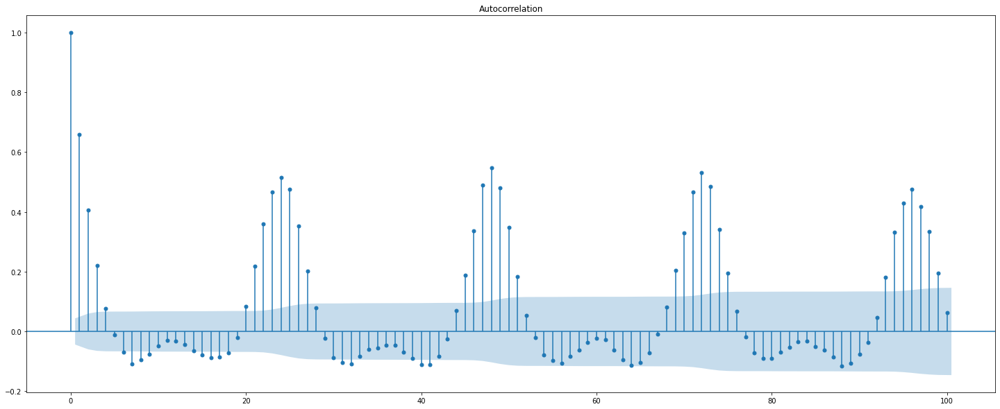

In [283]:
plot_acf(y_train.energy,lags=100)
plt.show()

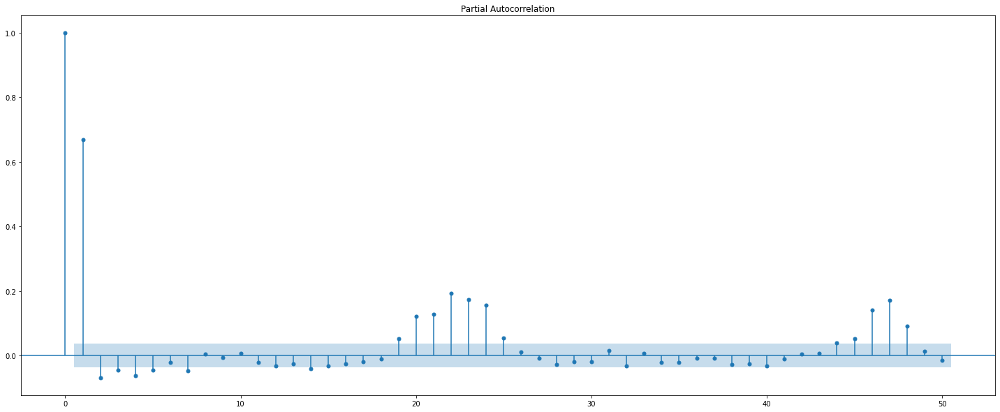

In [284]:
plot_pacf(model_data_y.energy,lags=50)
plt.show()

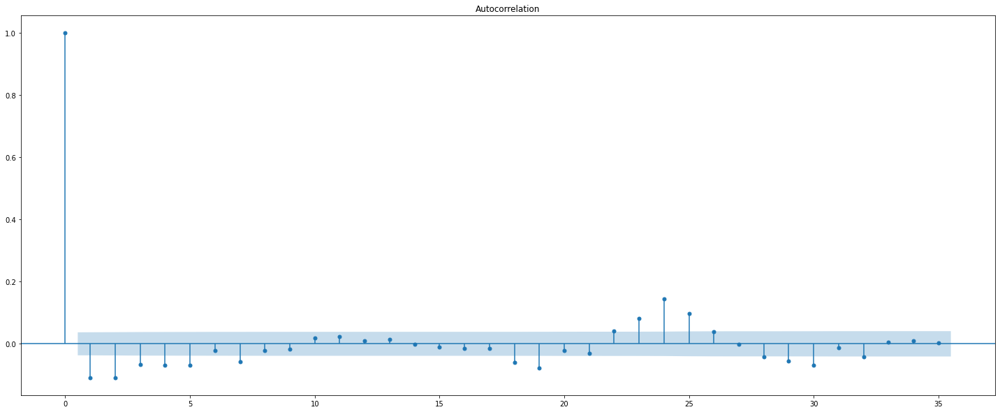

In [285]:
plot_acf(model_data_y.energy.diff().dropna())
plt.show()

In [286]:
X_train.index = pd.DatetimeIndex(X_train.index).to_period('60M')
X_test.index = pd.DatetimeIndex(X_test.index).to_period('60M')
y_train.index = pd.DatetimeIndex(y_train.index).to_period('60M')
y_test.index = pd.DatetimeIndex(y_test.index).to_period('60M')

In [287]:
X_train['time'] = X_train['hour'] + X_train['minute']/60
X_test['time'] = X_test['hour'] + X_test['minute']/60

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [288]:
t = sm.tsa.adfuller(model_data_y.energy, autolag='AIC')
pd.Series(t[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])

Test Statistic                   -5.224078
p-value                           0.000008
#Lags Used                       24.000000
Number of Observations Used    2783.000000
dtype: float64

In [289]:
X_train['hourofd_x'] = np.sin(X_train['time']/24*2*math.pi)
X_train['hourofd_y'] = np.cos(X_train['time']/24*2*math.pi)
X_test['hourofd_x'] = np.sin(X_test['time']/24*2*math.pi)
X_test['hourofd_y'] = np.cos(X_test['time']/24*2*math.pi)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

In [290]:
X_train = pd.get_dummies(data=X_train, columns=['daypart'])
X_test = pd.get_dummies(data=X_test, columns=['daypart'])

In [291]:
X_train_no_out, y_train_no_out = cut_outlier(X_train, y_train)

2000
2011-12    True
2011-12    True
2011-12    True
2011-12    True
2011-12    True
           ... 
2013-07    True
2013-07    True
2013-07    True
2013-07    True
2013-07    True
Freq: 60M, Length: 2000, dtype: bool


C:\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys


In [292]:
model_no_out, output_test_no_out = cut_outlier(model_data_x, model_data_y)

2808
2011-12-07 00:00:00    True
2011-12-07 01:00:00    True
2011-12-07 02:00:00    True
2011-12-07 03:00:00    True
2011-12-07 04:00:00    True
                       ... 
2014-02-26 19:00:00    True
2014-02-26 20:00:00    True
2014-02-26 21:00:00    True
2014-02-26 22:00:00    True
2014-02-26 23:00:00    True
Length: 2808, dtype: bool


C:\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys


In [293]:
X_train_filt = model_no_out[:1900]
y_train_filt = output_test_no_out[:1900]
X_test_filt = model_no_out[1900:]
y_test_filt = output_test_no_out[1900:]

X_train_filt.index = pd.DatetimeIndex(X_train_filt.index).to_period('60M')
X_test_filt.index = pd.DatetimeIndex(X_test_filt.index).to_period('60M')
y_train_filt.index = pd.DatetimeIndex(y_train_filt.index).to_period('60M')
y_test_filt.index = pd.DatetimeIndex(y_test_filt.index).to_period('60M')

X_train_filt['time'] = X_train_filt['hour'] + X_train_filt['minute']/60
X_test_filt['time'] = X_test_filt['hour'] + X_test_filt['minute']/60

X_train_filt['hourofd_x'] = np.sin(X_train_filt['time']/24*2*math.pi)
X_train_filt['hourofd_y'] = np.cos(X_train_filt['time']/24*2*math.pi)

X_test_filt['hourofd_x'] = np.sin(X_test_filt['time']/24*2*math.pi)
X_test_filt['hourofd_y'] = np.cos(X_test_filt['time']/24*2*math.pi)

X_train_filt = pd.get_dummies(data=X_train_filt, columns=['daypart'])
X_test_filt = pd.get_dummies(data=X_test_filt, columns=['daypart'])

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the

#  SARIMAX Model

In [197]:
endog = y_train
feat_srm = list(set(list(X_train.columns))-set(['lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']))
X_train_srm = X_train.loc[:, feat_srm]
exog = sm.add_constant(X_train_srm)
model = SARIMAX(endog = endog, exog = exog, order=(5,0,5),seasonal_order=(3,1, 3, 24))
model_fit = model.fit()
print(model_fit.summary())

C:\anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                                         SARIMAX Results                                          
Dep. Variable:                                     energy   No. Observations:                 2000
Model:             SARIMAX(5, 0, 5)x(3, 1, [1, 2, 3], 24)   Log Likelihood                -482.764
Date:                                    Tue, 09 Nov 2021   AIC                           1041.529
Time:                                            18:15:36   BIC                           1253.905
Sample:                                        12-31-2011   HQIC                          1119.556
                                             - 07-31-2013                                         
Covariance Type:                                      opg                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              1.999e-08   2848.

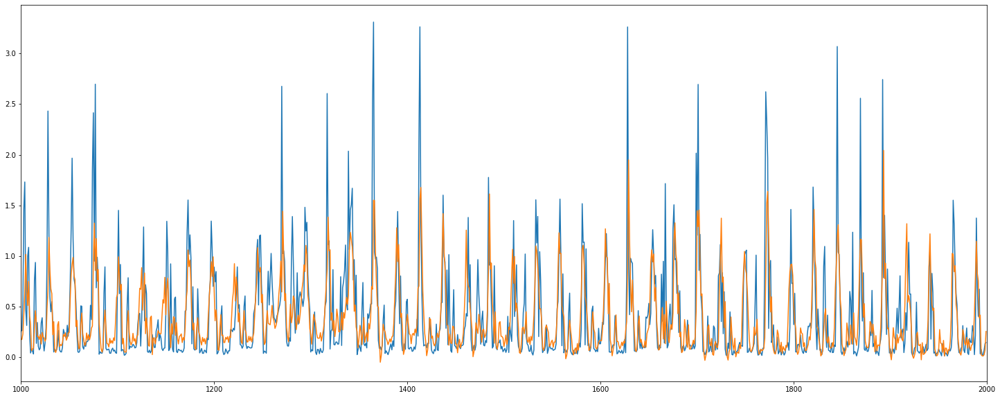

In [198]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[:2000], y_train)
plt.plot(weather_energy.index[:2000], model_fit.fittedvalues)
plt.xlim(weather_energy.index[1000], weather_energy.index[2000])
plt.show()

In [199]:
train_score = mean_squared_error(y_train, model_fit.fittedvalues)
print('Test MSE: %.3f' % train_score)

Test MSE: 0.093


datetime
2011-12    0.634730
2011-12    0.304113
2011-12    0.311068
2011-12   -0.031084
2011-12   -0.031721
             ...   
2013-07    0.013220
2013-07    0.003184
2013-07    0.045229
2013-07    0.062977
2013-07   -0.109716
Freq: 60M, Length: 2000, dtype: float64


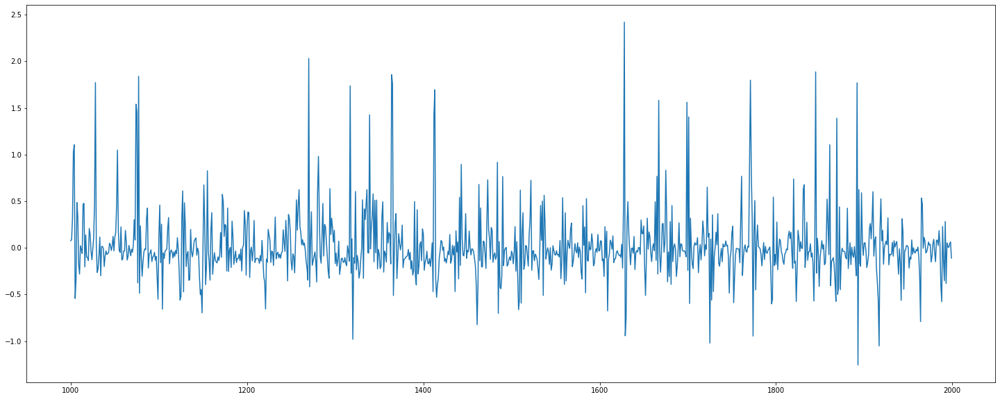

In [200]:
residuals = model_fit.resid
print(residuals)
plt.plot(weather_energy.index[1000:2000], residuals[1000:2000])

In [201]:
lags_ar = np.zeros(25)
lags_ar[0] = 1
lags_ar[1] = 1
lags_ar[23] = 1
lags_ar[24] = 1
llar = lags_ar.tolist()

In [202]:
model_res = SARIMAX(endog = residuals, exog = exog, order=(llar,0,llar), mle_regression = True)
model_res_fit = model_res.fit()

C:\anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


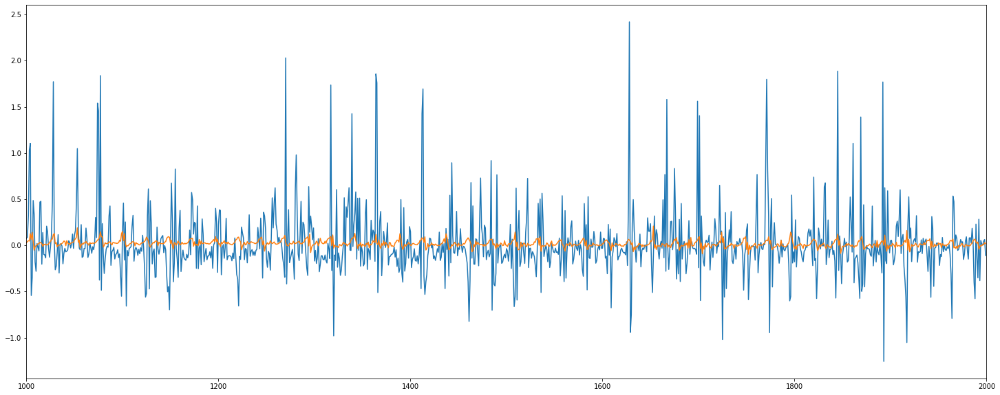

In [203]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[1000:2000], residuals[1000:2000])
plt.plot(weather_energy.index[1000:2000], model_res_fit.fittedvalues[1000:2000])
plt.xlim(weather_energy.index[1000], weather_energy.index[2000])
plt.show()

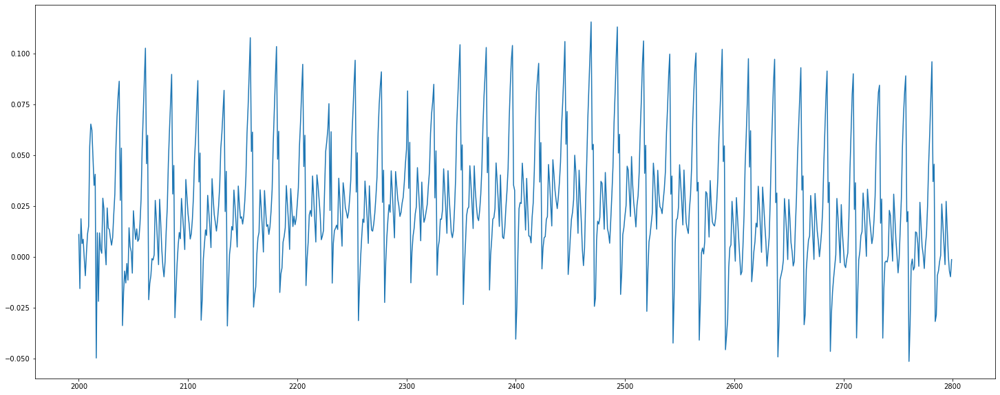

In [207]:
predictions_res = model_res_fit.predict(start=2000, end=2799, dynamic= True, exog = exog1[:800])
plt.plot(weather_energy.index[2000:2800], predictions_res)

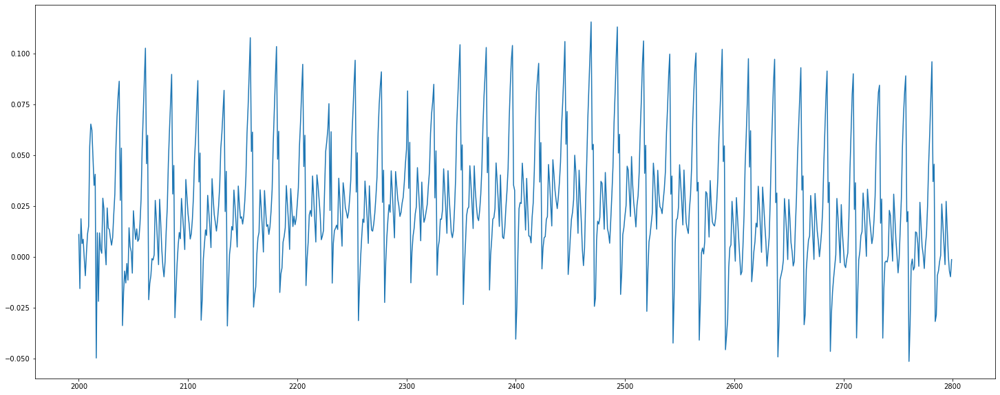

In [206]:
feat_srm = list(set(list(X_test.columns))-set(['lag1', 'lag2', 'lag3', 'lag4', 'lag5', 'lag24', 'lag25', 'lag26']))
X_test_srm = X_test.loc[:, feat_srm]
exog1 = sm.add_constant(X_test_srm)
forecasted_res = model_res_fit.forecast(800, exog = exog1[:800], alpha=0.05)
plt.plot(weather_energy.index[2000:2800], forecasted_res[:800])

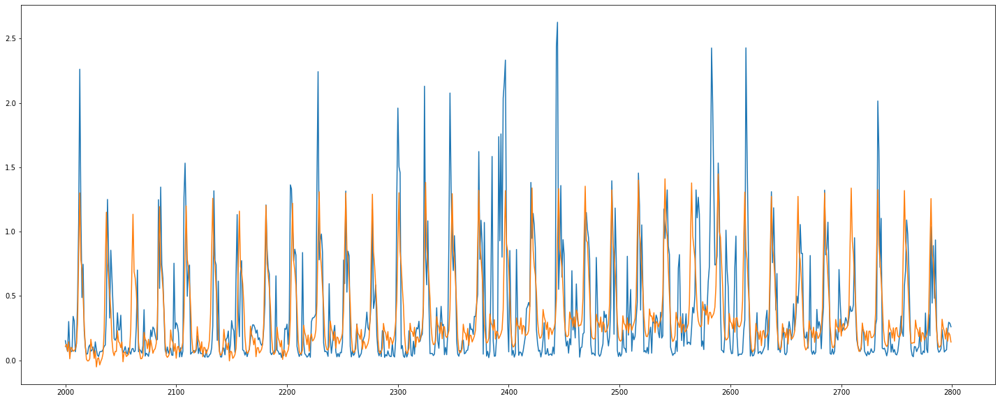

In [213]:
#exog1 = sm.add_constant(test[['temperature','time','humidity','pressure','holiday_ind']])
forecasted = model_fit.forecast(800, exog = exog1[:800], alpha=0.05) - forecasted_res
#print(train['energy'])
plt.plot(weather_energy.index[2000:2800], y_test[:800])
plt.plot(weather_energy.index[2000:2800], forecasted)


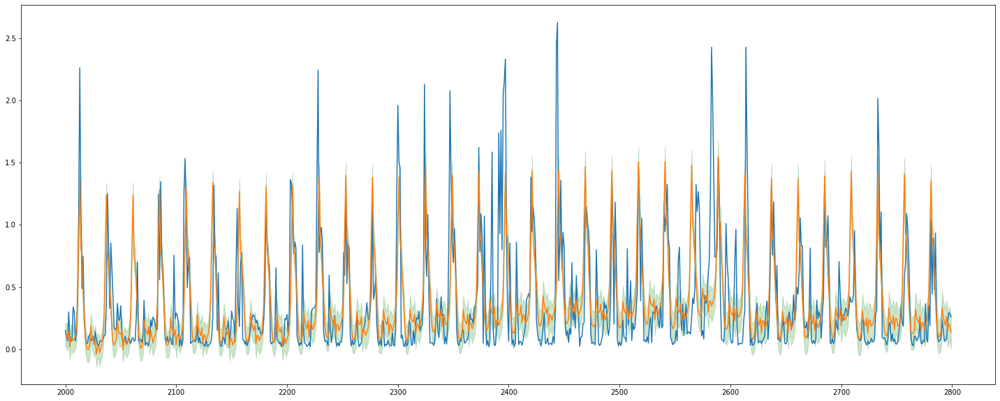

In [214]:
exog2 = sm.add_constant(train[['temperature','dayofy_y', 'dayofy_x','humidity','holiday_ind','time', 'month','ld0', 'ld1', 'ld2', 'ld3', 'daypart_afternoon','daypart_evening','daypart_morning','daypart_night','daypart_noon' ]][2000:])
prediction = model_fit.get_prediction(start=2000,end=2799,dynamic=False, exog = exog1[:800])
prediction_ci = prediction.conf_int()
plt.plot(weather_energy.index[2000:2800], y_test[:800])
plt.plot(weather_energy.index[2000:2800], prediction.predicted_mean)
plt.fill_between(weather_energy.index[2000:2800], prediction.predicted_mean + prediction.var_pred_mean, prediction.predicted_mean - prediction.var_pred_mean, color='g', alpha=0.2)

In [215]:
test_score = mean_squared_error(train['energy'][2000:2800], forecasted)
test_score1 = mean_squared_error(train['energy'][2000:2800], prediction.predicted_mean)
print('Test MSE: %.3f' % test_score)
print('Test MSE: %.3f' % test_score1)

Test MSE: 0.121
Test MSE: 0.124


In [216]:
r2_score(train['energy'][2000:2800], forecasted)

0.3800797642292858

## SVR 

In [449]:
svr_fit = svm.NuSVR(kernel='poly', degree = 3,C = 100, nu = 0.7).fit(X_train, y_train)
svrscore = svr_fit.score(X_train, y_train)
print(svrscore)

C:\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.617920261420411


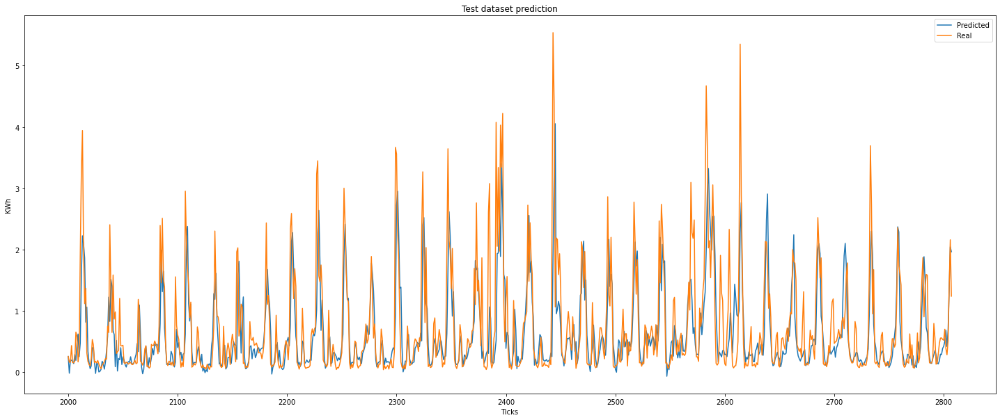

In [450]:
predictions_svr = svr_fit.predict(X_test)
plt.plot(weather_energy.index[2000:], predictions_svr, label = 'Predicted')
plt.plot(weather_energy.index[2000:],y_test, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

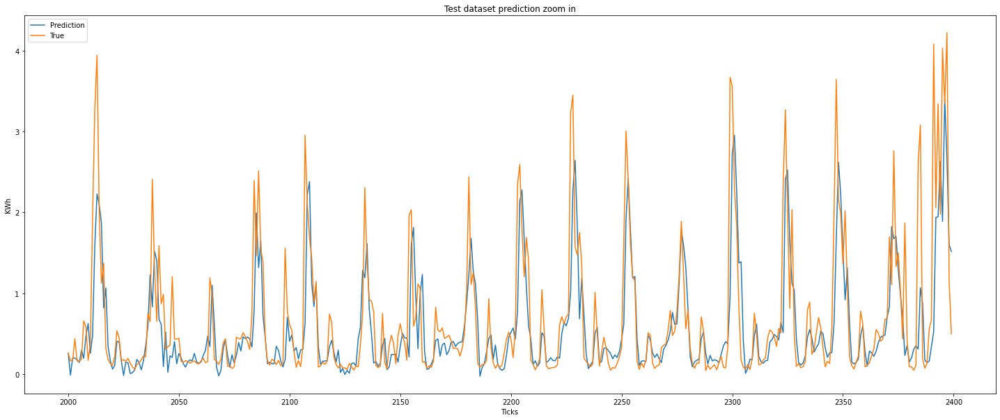

In [404]:
plt.plot(weather_energy.index[2000:2400], predictions_svr[:400], label = 'Prediction')
plt.plot(weather_energy.index[2000:2400],y_test[:400], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

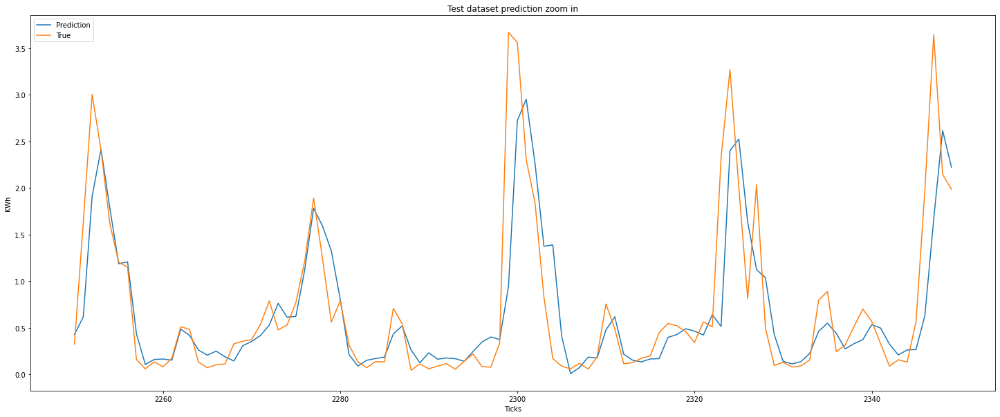

In [405]:
plt.plot(weather_energy.index[2250:2350], predictions_svr[250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [341]:
test_score_svr = mean_squared_error(y_test, predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.328


In [342]:
r2_score(y_test, predictions_svr)

0.5333020542738562

In [343]:
mda(np.asarray(y_test), pred_xg)

0.4938352738080058

In [451]:
test_score_mae = mean_absolute_error(y_test, predictions_svr)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.335


### No outliers in train data

In [687]:
svr_fit = svm.NuSVR(kernel='poly', degree = 3,C = 100, nu = 0.7).fit(X_train_no_out, y_train_no_out)
svrscore = svr_fit.score(X_train_no_out, y_train_no_out)
print(svrscore)

0.6302821028068932


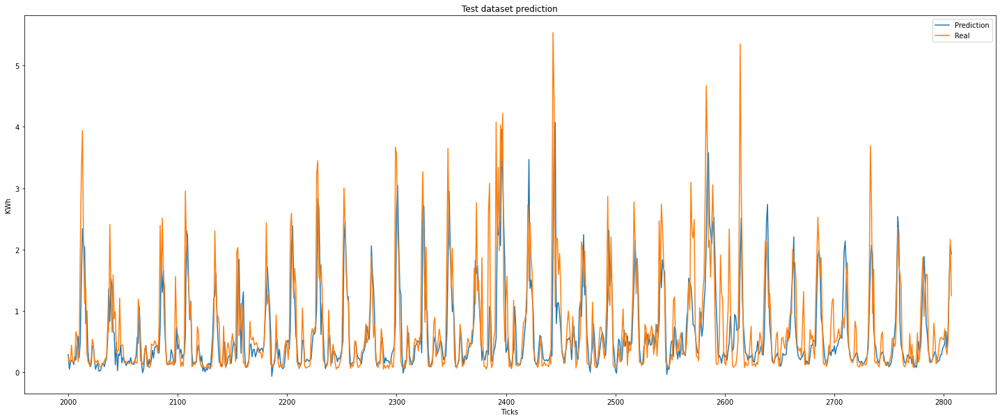

In [688]:
predictions_svr = svr_fit.predict(X_test)
plt.plot(weather_energy.index[2000:], predictions_svr, label = 'Prediction')
plt.plot(weather_energy.index[2000:],y_test, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [689]:
test_score_svr = mean_squared_error(y_test, predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.337


In [690]:
r2_score(y_test, predictions_svr)

0.5214354089601007

In [691]:
mda(np.asarray(y_test), predictions_svr)

0.49961996102873096

In [692]:
test_score_mae = mean_absolute_error(y_test, predictions_svr)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.337


### No outliers in all data

In [455]:
svr_fit = svm.NuSVR(kernel='poly', degree = 3,C = 100, nu = 0.7).fit(X_train_filt, y_train_filt)
svrscore = svr_fit.score(X_train_filt, y_train_filt)
print(svrscore)

0.685512297296405


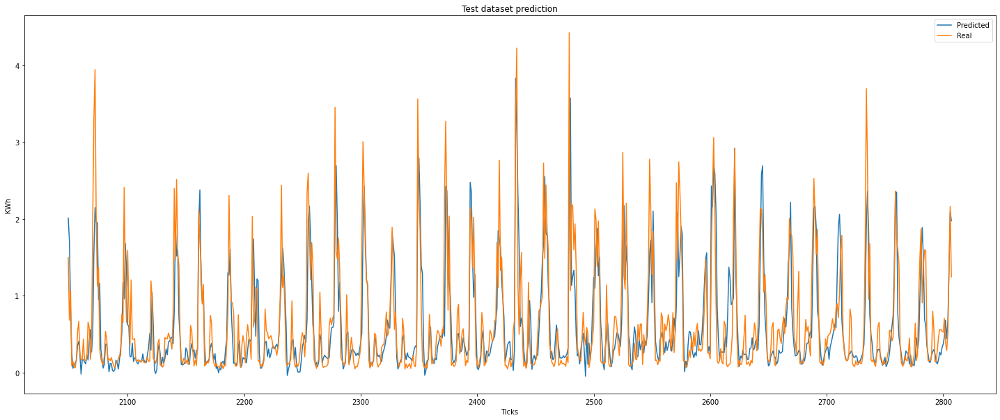

In [456]:
predictions_svr = svr_fit.predict(X_test_filt)
plt.plot(weather_energy.index[2049:], predictions_svr, label = 'Predicted')
plt.plot(weather_energy.index[2049:],y_test_filt, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [351]:
test_score_svr = mean_squared_error(y_test_filt, predictions_svr)
print('Test MSE: %.3f' % test_score_svr)

Test MSE: 0.192


In [352]:
r2_score(y_test_filt, predictions_svr)

0.6257121923777206

In [353]:
mda(np.asarray(y_test_filt), predictions_svr)

0.5844327176781002

In [457]:
test_score_mae = mean_absolute_error(y_test_filt, predictions_svr)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.279


## GPR

In [636]:
kernels_gpr = kernels.RBF(length_scale = 0.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2) 
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train, y_train)
gprscore = gpr.score(X_train, y_train)
print(gprscore)

0.6841534370068234


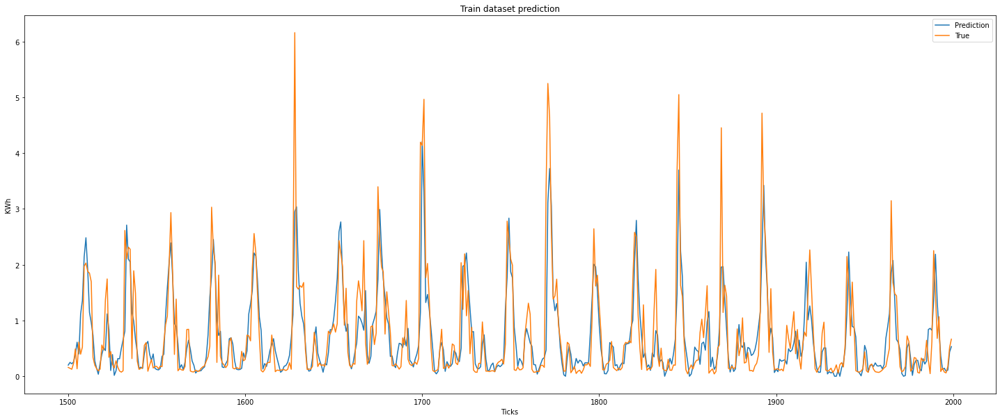

In [637]:
predictions_gpr_tr = gpr.predict(X_train, return_std = True)
for i in range(len(predictions_gpr_tr[0])):
    if predictions_gpr_tr[0][i] < 0:
        predictions_gpr_tr[0][i] = 0
plt.plot(weather_energy.index[1500:2000], predictions_gpr_tr[0][1500:2000], label = 'Prediction')
plt.plot(weather_energy.index[1500:2000],y_train[1500:2000], label = 'True')
#plt.fill_between(weather_energy.index[:2000], predictions_gpr_tr[0].flatten() + predictions_gpr_tr[1], predictions_gpr_tr[0].flatten() - predictions_gpr_tr[1], color='g', alpha=0.2)
plt.title('Train dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

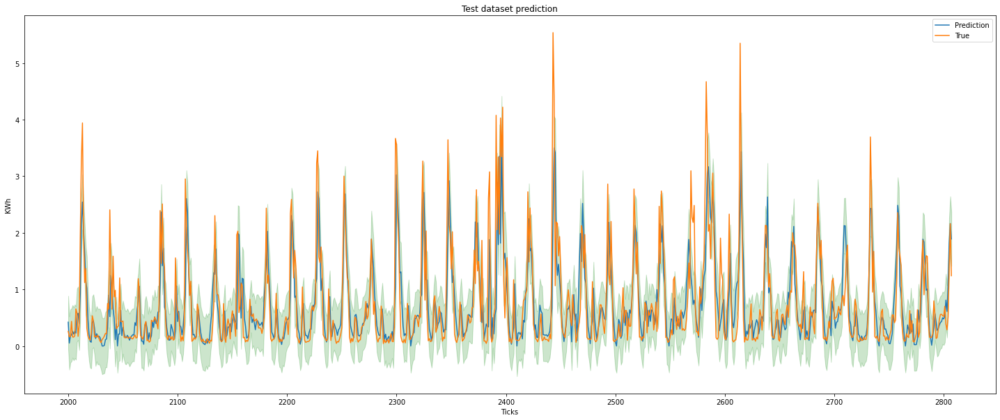

In [638]:
predictions_gpr = gpr.predict(X_test, return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.plot(weather_energy.index[2000:], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2000:],y_test, label = 'True')
plt.fill_between(weather_energy.index[2000:], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

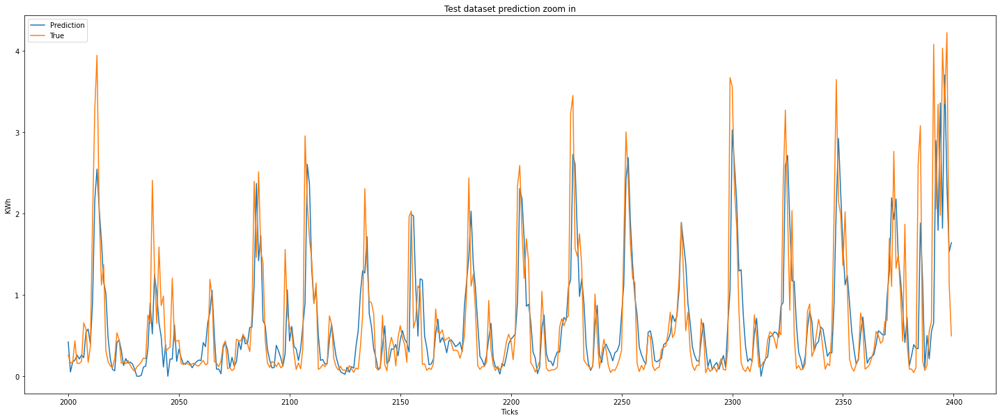

In [639]:
plt.plot(weather_energy.index[2000:2400], predictions_gpr[0][0:400], label = 'Prediction')
plt.plot(weather_energy.index[2000:2400],y_test[:400], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

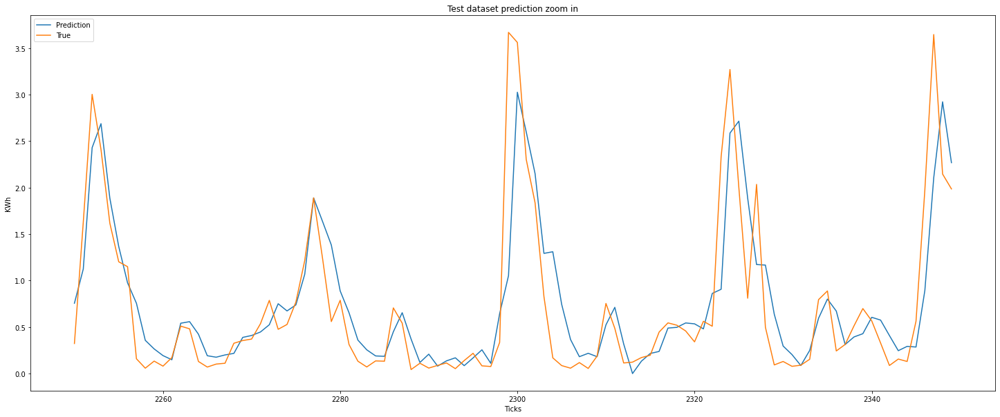

In [640]:
plt.plot(weather_energy.index[2250:2350], predictions_gpr[0][250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [641]:
test_score = mean_squared_error(y_test, predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.284


In [642]:
r2_score(y_test, predictions_gpr[0])

0.5957854964922796

In [643]:
mda(np.asarray(y_test), predictions_gpr[0])

0.5985130111524164

In [644]:
test_score_mae = mean_absolute_error(y_test, predictions_gpr[0])
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.332


### No outliers in train data

In [653]:
kernels_gpr = kernels.RBF(length_scale = 0.51) * kernels.DotProduct() + kernels.WhiteKernel(noise_level = 0.2) 
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train_no_out, y_train_no_out)
gprscore = gpr.score(X_train_no_out, y_train_no_out)
print(gprscore)

0.6891118021947034


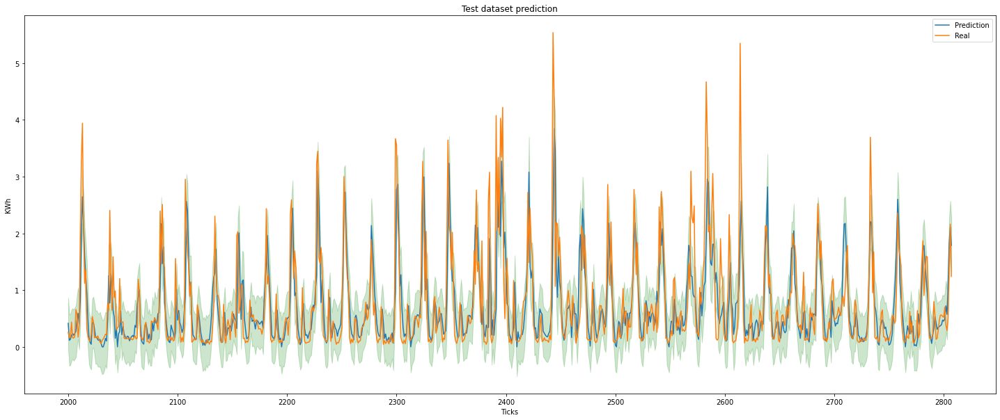

In [654]:
predictions_gpr = gpr.predict(X_test, return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.plot(weather_energy.index[2000:], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2000:],y_test, label = 'Real')
plt.fill_between(weather_energy.index[2000:], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [655]:
test_score = mean_squared_error(y_test, predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.294


In [656]:
r2_score(y_test, predictions_gpr[0])

0.5820882396215039

In [657]:
mda(np.asarray(y_test), predictions_gpr[0])

0.4987017254537051

In [658]:
test_score_mae = mean_absolute_error(y_test, predictions_gpr[0])
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.336


### No outliers in all data

In [659]:
gpr = GaussianProcessRegressor(kernel=kernels_gpr, random_state=0).fit(X_train_filt, y_train_filt)
gprscore = gpr.score(X_train_filt, y_train_filt)
print(gprscore)

0.7428156752405144


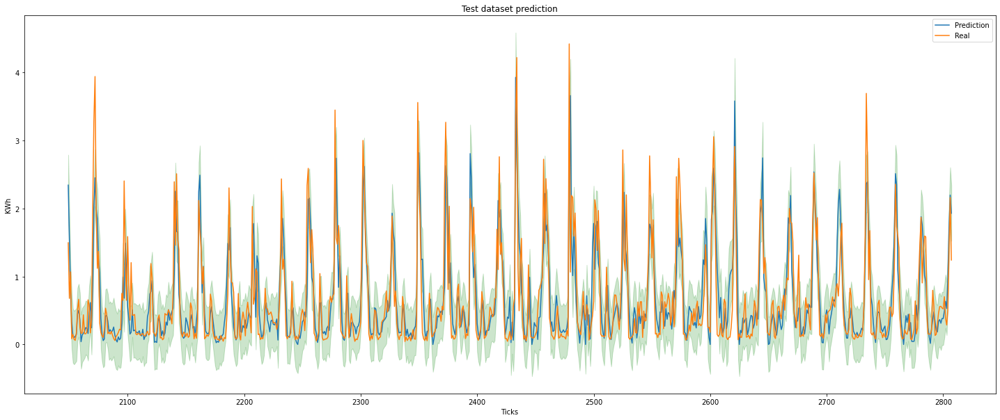

In [660]:
predictions_gpr = gpr.predict(X_test_filt, return_std = True)
for i in range(len(predictions_gpr[0])):
    if predictions_gpr[0][i] < 0:
        predictions_gpr[0][i] = 0
plt.plot(weather_energy.index[2049:], predictions_gpr[0], label = 'Prediction')
plt.plot(weather_energy.index[2049:],y_test_filt, label = 'Real')
plt.fill_between(weather_energy.index[2049:], predictions_gpr[0].flatten() + predictions_gpr[1], predictions_gpr[0].flatten() - predictions_gpr[1], color='g', alpha=0.2)
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [661]:
test_score = mean_squared_error(y_test_filt, predictions_gpr[0])
print('Test MSE: %.3f' % test_score)

Test MSE: 0.170


In [662]:
r2_score(y_test_filt, predictions_gpr[0])

0.6688756563334435

In [663]:
mda(np.asarray(y_test_filt), predictions_gpr[0])

0.6029023746701847

In [664]:
test_score_mae = mean_absolute_error(y_test_filt, predictions_gpr[0])
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.276


## XGBoost

In [665]:
model = XGBRegressor(objective='reg:squarederror', n_estimators=400, min_child_weight=0.4, max_depth= 14, learning_rate= 0.05, gamma= 0.8)

In [666]:
model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0.8, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.05, max_delta_step=0,
             max_depth=14, min_child_weight=0.4, missing=nan,
             monotone_constraints='()', n_estimators=400, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [667]:
pred_xg = model.predict(X_test)

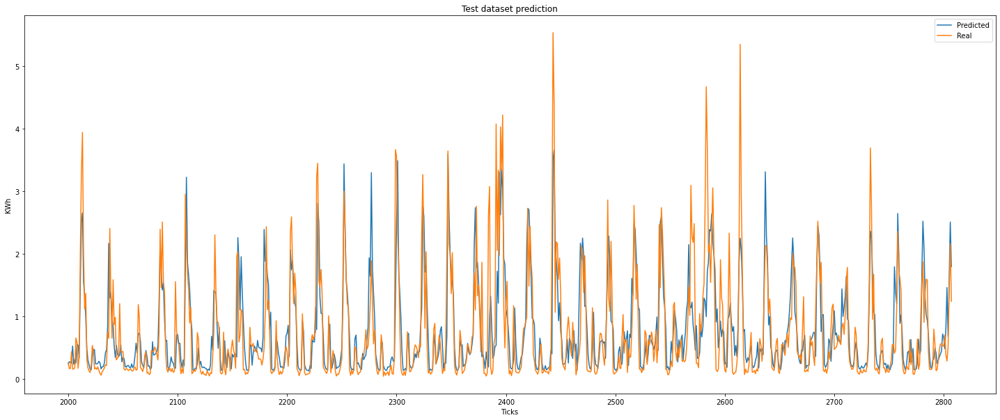

In [668]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2000:], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2000:],y_test, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

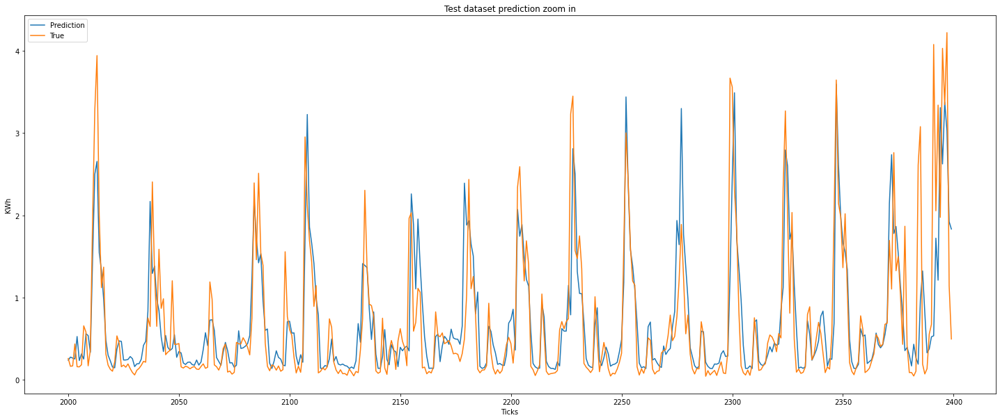

In [669]:
plt.plot(weather_energy.index[2000:2400], pred_xg[:400], label = 'Prediction')
plt.plot(weather_energy.index[2000:2400],y_test[:400], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

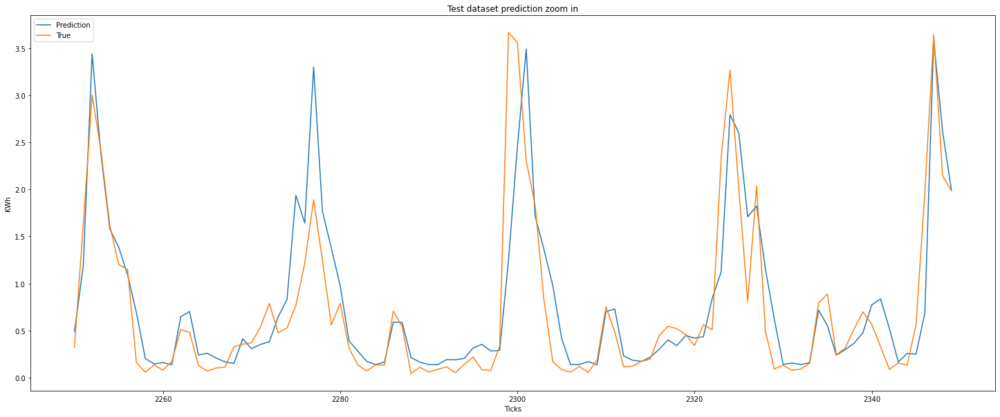

In [670]:
plt.plot(weather_energy.index[2250:2350], pred_xg[250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [671]:
test_score = mean_squared_error(y_test, pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.284


In [672]:
r2_score(y_test, pred_xg)

0.5965637300770408

In [673]:
mda(np.asarray(y_test), pred_xg)

0.49910402933440207

In [674]:
test_score_mae = mean_absolute_error(y_test, pred_xg)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.323


### No outliers in train data

In [508]:
model.fit(X_train_no_out, y_train_no_out)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0.8, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.05, max_delta_step=0,
             max_depth=14, min_child_weight=0.4, missing=nan,
             monotone_constraints='()', n_estimators=400, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [509]:
pred_xg = model.predict(X_test)

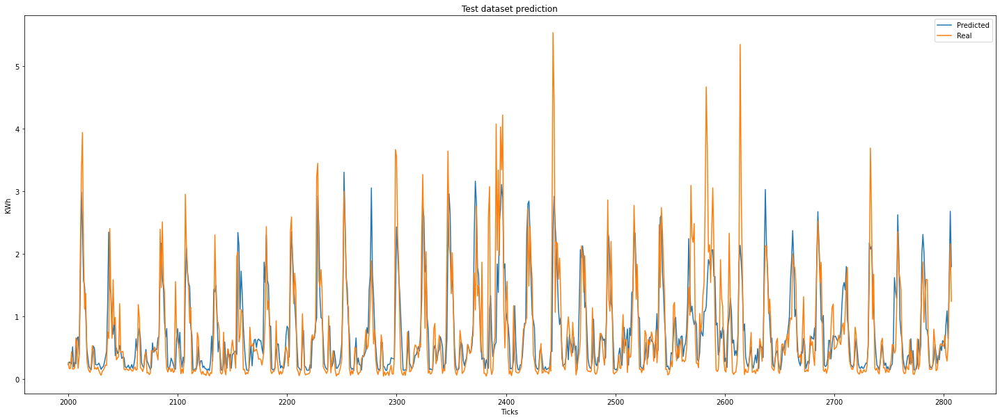

In [428]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2000:], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2000:],y_test, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

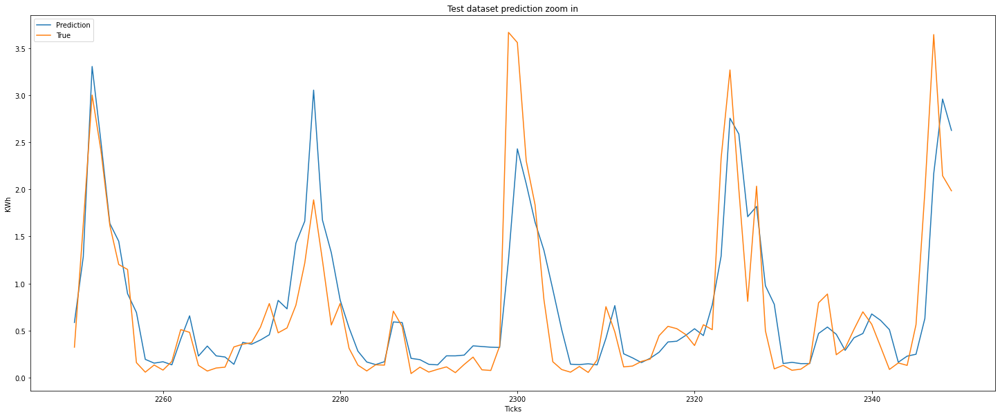

In [460]:
plt.plot(weather_energy.index[2250:2350], pred_xg[250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [510]:
test_score = mean_squared_error(y_test, pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.284


In [511]:
r2_score(y_test, pred_xg)

0.5957963375343893

In [512]:
mda(np.asarray(y_test), pred_xg)

0.49841919143062025

In [513]:
test_score_mae = mean_absolute_error(y_test, pred_xg)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.321


### No outliers in all data

In [577]:
model = XGBRegressor(objective='reg:squarederror', n_estimators=400, min_child_weight=0.4, max_depth= 14, learning_rate= 0.02, gamma= 0.8)

In [578]:
model.fit(X_train_filt, y_train_filt)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0.8, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.02, max_delta_step=0,
             max_depth=14, min_child_weight=0.4, missing=nan,
             monotone_constraints='()', n_estimators=400, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [579]:
pred_xg = model.predict(X_test_filt)

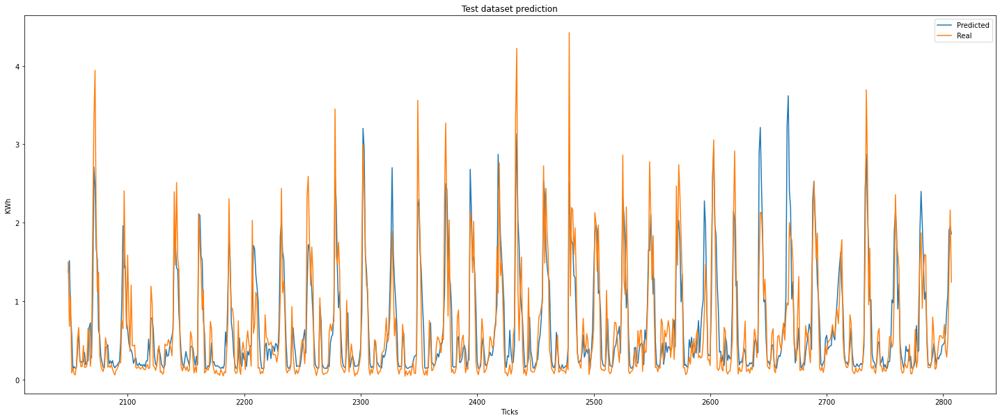

In [585]:
plt.rcParams["figure.figsize"] = (25,10)
plt.plot(weather_energy.index[2049:], pred_xg, label = 'Predicted')
plt.plot(weather_energy.index[2049:],y_test_filt, label = 'Real')
plt.title('Test dataset prediction')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

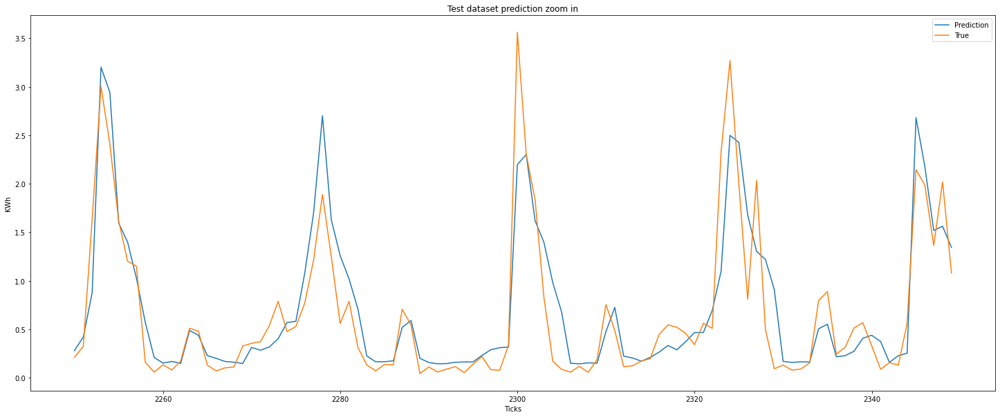

In [584]:
plt.plot(weather_energy.index[2250:2350], pred_xg[250:350], label = 'Prediction')
plt.plot(weather_energy.index[2250:2350],y_test_filt[250:350], label = 'True')
plt.title('Test dataset prediction zoom in')
plt.xlabel('Ticks')
plt.ylabel('KWh')
plt.legend()

In [580]:
test_score = mean_squared_error(y_test_filt, pred_xg)
print('Test MSE: %.3f' % test_score)

Test MSE: 0.155


In [581]:
r2_score(y_test_filt, pred_xg)

0.697254284224442

In [582]:
mda(np.asarray(y_test_filt), pred_xg)

0.6094986807387863

In [583]:
test_score_mae = mean_absolute_error(y_test_filt, pred_xg)
print('Test MAE: %.3f' % test_score_mae)

Test MAE: 0.255
